Notes:
-----

Basic example of a CNN for image classification
Decrease "area" of tensor by 1/2 at each "block" and scale "depth" by a factor of 2
before passing to a Fully Connected Network and Classifier

Sample Architecture starting with 256 x 256 RGB images
Layers
 - 256 x 256 x 3(RGB) - image layer (size: 196,608)
 - 128 x 128 x 16 (stride of 2) (size: 262,144)
 - 64 x 64 x 64 (size: 262,144)
 - 32 x 32 x 256 (size: 262,144)
 - Fully Connected Network
 - Sigmoid Clasifier


Pooling:
-----
Use a Conv Stride of 1 and then process the results through a layer that "pools" a neighborhood of responses. 
Helps to prevent overy agressive down sampling

Architecture: ConvStride1 -> MaxPooling(Params: PoolingSize, PoolingStride)

AlexNet/LeNet-5 Architecture:
---------------------------

 - Image(Input)
 - Convolution
 - Max Pooling
 - Convolution
 - Max Pooling
 - Fully Connected
 - Fully Connected
 - Classifier(Output)
 
 
Note: Also Consider Avg Pooling, which produce a "bluerred representation"
1x1 Convolutions to "cheaply" add depth and convert the convolution to a "mini- deep neural network"

Attach to the output of the a larger Convolution(e.g ConvStride2 Size3) to add additional depth.

A convolution by itself is a linear-classifier mapping each patch of the image to a sub-space. (Assuming an input with depth = 3 and Conv Layer with depth 16 that samples from a 3x3 patch, then you're input is 3x3x3 and your output is 1x1x16(16)

Inception Modules
----------------

 - Run the following Models over the Samel Layer
  - Avg Pooling -> 1x1 Convolution
  - 1x1 Convolution -> 5x5 Convolution
  - 1x1 Convolution -> 3x3 Convolution
  - 1x1 Convolution
 - Concatenate the 4 Models together 

--------------------------------------

In [1]:
import numpy as np
import tensorflow as tf
import cPickle as pickle
import matplotlib.pyplot as plt
import time
%matplotlib inline

In [2]:
PKL_FILE = 'notMNIST.pickle'
IMG_WIDTH = 28
IMG_HEIGHT = 28
NUM_CHANNELS = 1
IMG_PIXELS = IMG_HEIGHT * IMG_WIDTH
NUM_CLASSES = 10

with open(PKL_FILE, 'rb') as f:
    save_file = pickle.load(f)
    train_dataset = save_file['train_dataset']
    train_labels  = save_file['train_labels']
    test_dataset  = save_file['test_dataset']
    test_labels   = save_file['test_labels']
    val_dataset   = save_file['valid_dataset']
    val_labels    = save_file['valid_labels']
    
    del save_file
    
print 'Training', train_dataset.shape, train_labels.shape
print 'Test', test_dataset.shape, test_labels.shape
print 'Validation', val_dataset.shape, val_labels.shape

def reformat_dataset(dataset):
    return dataset.reshape(-1, IMG_HEIGHT, IMG_WIDTH, NUM_CHANNELS).astype(np.float32)

def one_hot_encode(labels):
    if(len(labels.shape) > 1):
        raise Exception('labels should be a vector')
    return (np.arange(NUM_CLASSES) == labels.reshape(-1, 1)).astype(np.float32)

train_dataset = reformat_dataset(train_dataset)
train_labels  = one_hot_encode(train_labels)
test_dataset  = reformat_dataset(test_dataset)
test_labels   = one_hot_encode(test_labels)
val_dataset   = reformat_dataset(val_dataset)
val_labels    = one_hot_encode(val_labels)

print 'Training', train_dataset.shape, train_labels.shape
print 'Test', test_dataset.shape, test_labels.shape
print 'Validation', val_dataset.shape, val_labels.shape

Training (200000, 28, 28) (200000,)
Test (10000, 28, 28) (10000,)
Validation (10000, 28, 28) (10000,)
Training (200000, 28, 28, 1) (200000, 10)
Test (10000, 28, 28, 1) (10000, 10)
Validation (10000, 28, 28, 1) (10000, 10)


In [3]:
def accuracy(predictions, labels):
    return 100.0*(np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))/float(predictions.shape[0]))

-------------------------------
Convolutional Model Architecure:
---------------------
 - 2 Convolutional Layers
 - 1 Fully Connected Layer
 - 1 Output Layer

------------------------

In [31]:
def ConvolutionalModel():
    patch_size = 5 
    conv_depth = 16
    num_hidden =  64
    stride = 2
    num_conv_layers = 2
    
    #size of input to Fully Connected Layers
    fc_input_size = (IMG_WIDTH //(stride ** num_conv_layers)) * (IMG_HEIGHT //(stride ** num_conv_layers)) * conv_depth
    
    input_dataset = tf.placeholder(tf.float32, shape = (None, IMG_WIDTH, IMG_HEIGHT, NUM_CHANNELS))
    input_labels = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))
    
    w1_conv = tf.Variable(tf.truncated_normal(shape = (patch_size, patch_size, NUM_CHANNELS, conv_depth), stddev=0.1))
    b1_conv = tf.Variable(tf.zeros([conv_depth]))
    
    w2_conv = tf.Variable(tf.truncated_normal(shape = (patch_size, patch_size, conv_depth, conv_depth), stddev=0.1))
    b2_conv = tf.Variable(tf.zeros([conv_depth]))
    
    w3_fc = tf.Variable(tf.truncated_normal(shape=(fc_input_size, num_hidden ),stddev = 0.1))
    b3_fc = tf.Variable(tf.constant(1.0, shape=[num_hidden]))
    
    w4_out = tf.Variable(tf.truncated_normal(shape = (num_hidden, NUM_CLASSES ), stddev = 0.1))
    b4_out = tf.Variable(tf.constant(1.0, shape=[NUM_CLASSES]))

    conv = tf.nn.conv2d(input_dataset, w1_conv, strides= [1, stride, stride, 1], padding='SAME')
    hidden = tf.nn.relu(conv + b1_conv)
    
    conv = tf.nn.conv2d(hidden, w2_conv, strides= [1, stride, stride, 1], padding='SAME')
    hidden = tf.nn.relu(conv + b2_conv)
    
    shape = hidden.get_shape().as_list()
    hidden_reshape = tf.reshape(hidden, (-1, shape[1] * shape[2] * shape[3]))
    hidden = tf.nn.relu(tf.matmul(hidden_reshape, w3_fc) + b3_fc)
    logits = tf.matmul(hidden, w4_out) + b4_out
    
    loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=input_labels, logits = logits))
    optimizer = tf.train.GradientDescentOptimizer(0.05).minimize(loss)
    
    preds = tf.nn.softmax(logits)
    
    return input_dataset, input_labels, loss, optimizer, preds
    

In [43]:
tf_input_dataset, tf_input_labels, tf_loss, tf_optimizer, tf_preds = ConvolutionalModel()
sess = tf.Session()
init = tf.initialize_all_variables()
sess.run(init)

BATCH_SIZE = 16
num_steps = 2001
train_dataset_size = train_dataset.shape[0]

print 'Initialize with batch size: %d; num_steps: %d'%(BATCH_SIZE, num_steps)

for step in range(num_steps):
    sample = np.random.choice(np.arange(train_dataset_size), BATCH_SIZE)
    data_batch = train_dataset[sample]
    label_batch = train_labels[sample]
    feed_dict = { tf_input_dataset : data_batch, 
                  tf_input_labels  : label_batch }
    _, loss, train_preds = sess.run([tf_optimizer, tf_loss, tf_preds], feed_dict=feed_dict)
    if (step % 100) == 0:
        #print train_preds
        print 'Minibatch: step: %d; loss: %f'%(step, loss)
        print 'Minibatch Accuracy %f'%(accuracy(train_preds, label_batch))
        valid_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : val_dataset})
        print 'Validation Accuray %f'%(accuracy(valid_preds, val_labels))

test_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : test_dataset})
print 'Test Accuracy %f'%(accuracy(test_preds, test_labels))

Initialize with batch size: 16; num_steps: 2001
Minibatch: step: 0; loss: 2.928964
Minibatch Accuracy 6.250000
Validation Accuray 11.080000
Minibatch: step: 100; loss: 1.024395
Minibatch Accuracy 62.500000
Validation Accuray 72.820000
Minibatch: step: 200; loss: 0.541914
Minibatch Accuracy 87.500000
Validation Accuray 75.640000
Minibatch: step: 300; loss: 0.405001
Minibatch Accuracy 87.500000
Validation Accuray 79.640000
Minibatch: step: 400; loss: 1.071407
Minibatch Accuracy 68.750000
Validation Accuray 81.190000
Minibatch: step: 500; loss: 0.678739
Minibatch Accuracy 68.750000
Validation Accuray 82.020000
Minibatch: step: 600; loss: 0.156934
Minibatch Accuracy 100.000000
Validation Accuray 81.820000
Minibatch: step: 700; loss: 0.916592
Minibatch Accuracy 81.250000
Validation Accuray 82.500000
Minibatch: step: 800; loss: 0.370167
Minibatch Accuracy 87.500000
Validation Accuray 82.210000
Minibatch: step: 900; loss: 0.343789
Minibatch Accuracy 87.500000
Validation Accuray 82.800000
Mini

-----------------------------

Problem 1
--------

add Max pooling to reduce dimensionality

------------------------

In [44]:
def ConvolutionalModelWithMaxPooling():
    patch_size = 5 
    conv_depth = 16
    num_hidden =  64
    stride = 2
    num_conv_layers = 2
    
    #size of input to Fully Connected Layers
    fc_input_size = (IMG_WIDTH //(stride ** num_conv_layers)) * (IMG_HEIGHT //(stride ** num_conv_layers)) * conv_depth
    
    input_dataset = tf.placeholder(tf.float32, shape = (None, IMG_WIDTH, IMG_HEIGHT, NUM_CHANNELS))
    input_labels = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))
    
    w1_conv = tf.Variable(tf.truncated_normal(shape = (patch_size, patch_size, NUM_CHANNELS, conv_depth), stddev=0.1))
    b1_conv = tf.Variable(tf.zeros([conv_depth]))
    
    w2_conv = tf.Variable(tf.truncated_normal(shape = (patch_size, patch_size, conv_depth, conv_depth), stddev=0.1))
    b2_conv = tf.Variable(tf.zeros([conv_depth]))
    
    w3_fc = tf.Variable(tf.truncated_normal(shape=(fc_input_size, num_hidden ),stddev = 0.1))
    b3_fc = tf.Variable(tf.constant(1.0, shape=[num_hidden]))
    
    w4_out = tf.Variable(tf.truncated_normal(shape = (num_hidden, NUM_CLASSES ), stddev = 0.1))
    b4_out = tf.Variable(tf.constant(1.0, shape=[NUM_CLASSES]))

    conv = tf.nn.conv2d(input_dataset, w1_conv, strides= [1, 1, 1, 1], padding='SAME')
    hidden = tf.nn.relu(conv + b1_conv)
    hidden = tf.nn.max_pool(hidden, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding='SAME')
    #apparently there's a small optimization to be made by doing max_pool before relu
    #https://github.com/tensorflow/tensorflow/issues/3180
    #although most expressions show pooling after conv/relu
    #http://cs231n.github.io/convolutional-networks/#layers
    
    conv = tf.nn.conv2d(hidden, w2_conv, strides= [1, 1, 1, 1], padding='SAME')
    hidden = tf.nn.relu(conv + b2_conv)
    hidden = tf.nn.max_pool(hidden, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding='SAME')
    
    shape = hidden.get_shape().as_list()
    hidden_reshape = tf.reshape(hidden, (-1, shape[1] * shape[2] * shape[3]))
    hidden = tf.nn.relu(tf.matmul(hidden_reshape, w3_fc) + b3_fc)
    logits = tf.matmul(hidden, w4_out) + b4_out
    
    loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=input_labels, logits = logits))
    optimizer = tf.train.GradientDescentOptimizer(0.05).minimize(loss)
    
    preds = tf.nn.softmax(logits)
    
    return input_dataset, input_labels, loss, optimizer, preds

In [46]:
tf_input_dataset, tf_input_labels, tf_loss, tf_optimizer, tf_preds = ConvolutionalModelWithMaxPooling()
sess = tf.Session()
init = tf.initialize_all_variables()
sess.run(init)

BATCH_SIZE = 16
num_steps = 5001
train_dataset_size = train_dataset.shape[0]

print 'Initialize with batch size: %d; num_steps: %d'%(BATCH_SIZE, num_steps)

for step in range(num_steps):
    sample = np.random.choice(np.arange(train_dataset_size), BATCH_SIZE)
    data_batch = train_dataset[sample]
    label_batch = train_labels[sample]
    feed_dict = { tf_input_dataset : data_batch, 
                  tf_input_labels  : label_batch }
    _, loss, train_preds = sess.run([tf_optimizer, tf_loss, tf_preds], feed_dict=feed_dict)
    if (step % 100) == 0:
        #print train_preds
        print 'Minibatch: step: %d; loss: %f'%(step, loss)
        print 'Minibatch Accuracy %f'%(accuracy(train_preds, label_batch))
        valid_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : val_dataset})
        print 'Validation Accuray %f'%(accuracy(valid_preds, val_labels))

test_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : test_dataset})
print 'Test Accuracy %f'%(accuracy(test_preds, test_labels))

Initialize with batch size: 16; num_steps: 5001
Minibatch: step: 0; loss: 2.405335
Minibatch Accuracy 18.750000
Validation Accuray 10.080000
Minibatch: step: 100; loss: 0.966409
Minibatch Accuracy 81.250000
Validation Accuray 74.090000
Minibatch: step: 200; loss: 1.014748
Minibatch Accuracy 81.250000
Validation Accuray 78.830000
Minibatch: step: 300; loss: 0.686121
Minibatch Accuracy 81.250000
Validation Accuray 80.550000
Minibatch: step: 400; loss: 0.258443
Minibatch Accuracy 93.750000
Validation Accuray 80.880000
Minibatch: step: 500; loss: 0.492153
Minibatch Accuracy 81.250000
Validation Accuray 83.070000
Minibatch: step: 600; loss: 0.672727
Minibatch Accuracy 81.250000
Validation Accuray 83.070000
Minibatch: step: 700; loss: 0.506374
Minibatch Accuracy 87.500000
Validation Accuray 83.910000
Minibatch: step: 800; loss: 0.090162
Minibatch Accuracy 100.000000
Validation Accuray 83.320000
Minibatch: step: 900; loss: 1.068743
Minibatch Accuracy 75.000000
Validation Accuray 84.080000
Min

-----------------------------

Problem 2
--------

Try to get best performance

------------------------

In [15]:
"""
Started with the above model:

Experimient 1:
Tried AdamOptimizer otheriwse same architecture as above with max pool
results: 94.5 test set; 88.4 validation set accuracy @ 5000 iterations

Experiment2: 
Keeping AdamOptimizer
Adding Regularization with 0.0001*tf.nn.l2_loss(var) where var is all weights and biases
results: 94.4 test set; 88.7 validation set acc @ 5000 iterations

Experiment3:
keeping l2 loss
Testing ELUs based on comments in forum: https://discussions.udacity.com/t/assignment-4-problem-2/46525/33?u=mkowoods
results:
Minibatch: step: 5000; loss: 0.586370
Minibatch Accuracy 87.500000
Validation Accuray 88.680000
Test Accuracy 94.660000
Total elapsed Time:  348.350495815

Experiment4:
keeping ELUs(and other assumptions from exp3)
changing size of FC layer to 256 Node from 64
Minibatch: step: 5000; loss: 0.338437
Minibatch Accuracy 93.750000
Validation Accuray 87.130000
Test Accuracy 93.070000
Total elapsed Time:  348.182077169
REJECTING CHANGE, might prove better with longer training

Experiment5:
Increasing Num Steps to 10000(doubling training)
Minibatch: step: 10000; loss: 0.220762
Minibatch Accuracy 93.750000
Validation Accuray 89.560000
Test Accuracy 95.020000
Total elapsed Time:  662.778376818

Experiment 6:
Increased Batch Size to 32, and reduced number of steps to 5001
Minibatch: step: 5000; loss: 0.541130
Minibatch Accuracy 84.375000
Validation Accuray 89.490000
Test Accuracy 95.300000
Total elapsed Time:  456.596991062

Experiment 7:
Using exp6; changing initialization to xavier_initializer for weights left bias the same
Minibatch: step: 5000; loss: 0.243189
Minibatch Accuracy 93.750000
Validation Accuray 89.090000
Test Accuracy 94.940000
Total elapsed Time:  419.492391825

Experiment 8:
leaving in xavier initialization(one less parameter to tune).
try doubling depth of 2nd conv layer to 32 from 16
Minibatch: step: 5000; loss: 0.390369
Minibatch Accuracy 90.625000
Validation Accuray 89.260000
Test Accuracy 95.290000
Total elapsed Time:  1081.81778908


Experiment 8a:
extending training for 5000 - 10000, iterations

Minibatch: step: 5000; loss: 0.205134
Minibatch Accuracy 93.750000
Validation Accuray 90.290000
Test Accuracy 95.660000
Total elapsed Time:  466.85304904

Experiment 8b:
extending training for 10000 - 15000, iterations

Minibatch: step: 5000; loss: 0.122964
Minibatch Accuracy 96.875000
Validation Accuray 90.770000
Test Accuracy 96.070000
Total elapsed Time:  482.55634284

Eperiment 8c:
extending training for 15000 - 20000, iterations

Minibatch: step: 5000; loss: 0.233454
Minibatch Accuracy 96.875000
Validation Accuray 91.070000
Test Accuracy 96.290000
Total elapsed Time:  493.590945005

The model at this point is saved at CNN-model-20000
Layers:
- Input Batch Size 32, image_dim = 28x28, layers = 1(grayscalse)

"Super Layer" 1:
- Conv2d 5x5 Stride = 1, Depth = 16, padding = SAME
- Activation: Elu
- Pooling: Max Pool Kernel Size = 2x2, Stride = 2, padding = SAME
- output dim: BATCH_SIZE x 14 x 14 x 16

"Super Layer 2":
- Conv2d 5x5 Stride = 1, Depth = 32, padding = SAME
- Activation: Elu
- Pooling: Max Pool Kernel Size = 2x2, Stride = 2, padding = SAME
- output dim: BATCH_SIZE x 7x7x32

Fully Connected Layer
- 64 hidden nodes(input is flattened layer from above 1568(7x7x32) nodes)
- Activation: Elu

Output: 
- 10 Nodes for the 10 classes


Loss:
- reduce_mean of softmax_cross_entropy_with_logits
- plus, 0.0001 * l2_loss for all weights and bias matrices 
- Optimizer: AdamOptiizer with defaults

Weight Initialization:
- xavier_initializer
- conv layers bias, initalized to 0
- fc layers bias, initialized to 1.0

"""

tf.reset_default_graph()

patch_size = 5 
conv_depth = 16
conv_depth_2 = 32
num_hidden =  64
stride = 2
num_conv_layers = 2

#size of input to Fully Connected Layers
fc_input_size = (IMG_WIDTH //(stride ** num_conv_layers)) * (IMG_HEIGHT //(stride ** num_conv_layers)) * conv_depth_2

input_dataset = tf.placeholder(tf.float32, shape = (None, IMG_WIDTH, IMG_HEIGHT, NUM_CHANNELS))
input_labels = tf.placeholder(tf.float32, shape = (None, NUM_CLASSES))

w1_conv = tf.get_variable("w1_conv", 
                          shape = (patch_size, patch_size, NUM_CHANNELS, conv_depth), 
                          initializer=tf.contrib.layers.xavier_initializer())
b1_conv = tf.Variable(tf.zeros([conv_depth]))


w2_conv = tf.get_variable("w2_conv", 
                          shape = (patch_size, patch_size, conv_depth, conv_depth_2), 
                          initializer=tf.contrib.layers.xavier_initializer())
b2_conv = tf.Variable(tf.zeros([conv_depth_2]))


w3_fc = tf.get_variable("w3_fc", 
                          shape = (fc_input_size, num_hidden ), 
                          initializer=tf.contrib.layers.xavier_initializer())
b3_fc = tf.Variable(tf.constant(1.0, shape=[num_hidden]))


w4_out = tf.get_variable("w4_out", 
                          shape = (num_hidden, NUM_CLASSES), 
                          initializer=tf.contrib.layers.xavier_initializer())
b4_out = tf.Variable(tf.constant(1.0, shape=[NUM_CLASSES]))


conv = tf.nn.conv2d(input_dataset, w1_conv, strides= [1, 1, 1, 1], padding='SAME')
hidden = tf.nn.relu(conv + b1_conv)
hidden = tf.nn.max_pool(hidden, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding='SAME')
#apparently there's a small optimization to be made by doing max_pool before relu
#https://github.com/tensorflow/tensorflow/issues/3180
#although most expressions show pooling after conv/relu
#http://cs231n.github.io/convolutional-networks/#layers

conv = tf.nn.conv2d(hidden, w2_conv, strides= [1, 1, 1, 1], padding='SAME')
hidden = tf.nn.elu(conv + b2_conv)
hidden = tf.nn.max_pool(hidden, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding='SAME')

shape = hidden.get_shape().as_list()
hidden_reshape = tf.reshape(hidden, (-1, shape[1] * shape[2] * shape[3]))
hidden = tf.nn.elu(tf.matmul(hidden_reshape, w3_fc) + b3_fc)
logits = tf.matmul(hidden, w4_out) + b4_out

loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=input_labels, logits = logits))
loss += sum(0.0001*tf.nn.l2_loss(var) for var in [w1_conv, b1_conv, w2_conv, b2_conv, w3_fc, b3_fc, w4_out, b4_out])
optimizer = tf.train.AdamOptimizer().minimize(loss)

preds = tf.nn.softmax(logits)
    
#    return input_dataset, input_labels, loss, optimizer, preds

tf_input_dataset, tf_input_labels, tf_loss, tf_optimizer, tf_preds = input_dataset, input_labels, loss, optimizer, preds
#tf_input_dataset, tf_input_labels, tf_loss, tf_optimizer, tf_preds = ConvolutionalModelFinal()
sess = tf.Session()
init = tf.initialize_all_variables()
sess.run(init)

BATCH_SIZE = 32
num_steps = 5001
train_dataset_size = train_dataset.shape[0]

print 'Initialize with batch size: %d; num_steps: %d'%(BATCH_SIZE, num_steps)
start = time.time()
for step in range(num_steps):
    sample = np.random.choice(np.arange(train_dataset_size), BATCH_SIZE)
    data_batch = train_dataset[sample]
    label_batch = train_labels[sample]
    feed_dict = { tf_input_dataset : data_batch, 
                  tf_input_labels  : label_batch }
    _, loss, train_preds = sess.run([tf_optimizer, tf_loss, tf_preds], feed_dict=feed_dict)
    if (step % 100) == 0:
        #print train_preds
        print 'Minibatch: step: %d; loss: %f'%(step, loss)
        print 'Minibatch Accuracy %f'%(accuracy(train_preds, label_batch))
        valid_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : val_dataset})
        print 'Validation Accuray %f'%(accuracy(valid_preds, val_labels))

test_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : test_dataset})
print 'Test Accuracy %f'%(accuracy(test_preds, test_labels))
print 'Total elapsed Time: ', time.time() - start


Initialize with batch size: 32; num_steps: 5001
Minibatch: step: 0; loss: 3.231637
Minibatch Accuracy 3.125000
Validation Accuray 10.000000
Minibatch: step: 100; loss: 0.432620
Minibatch Accuracy 87.500000
Validation Accuray 79.540000
Minibatch: step: 200; loss: 0.977682
Minibatch Accuracy 71.875000
Validation Accuray 82.660000
Minibatch: step: 300; loss: 0.844819
Minibatch Accuracy 81.250000
Validation Accuray 84.160000
Minibatch: step: 400; loss: 0.470135
Minibatch Accuracy 87.500000
Validation Accuray 85.120000
Minibatch: step: 500; loss: 0.685855
Minibatch Accuracy 84.375000
Validation Accuray 85.550000
Minibatch: step: 600; loss: 0.346839
Minibatch Accuracy 90.625000
Validation Accuray 85.930000
Minibatch: step: 700; loss: 0.508185
Minibatch Accuracy 90.625000
Validation Accuray 85.990000
Minibatch: step: 800; loss: 0.311782
Minibatch Accuracy 90.625000
Validation Accuray 86.630000
Minibatch: step: 900; loss: 0.253826
Minibatch Accuracy 93.750000
Validation Accuray 86.540000
Minib

In [18]:
print 'Re - Running with batch size: %d; num_steps: %d'%(BATCH_SIZE, num_steps)
start = time.time()
for step in range(num_steps):
    sample = np.random.choice(np.arange(train_dataset_size), BATCH_SIZE)
    data_batch = train_dataset[sample]
    label_batch = train_labels[sample]
    feed_dict = { tf_input_dataset : data_batch, 
                  tf_input_labels  : label_batch }
    _, loss, train_preds = sess.run([tf_optimizer, tf_loss, tf_preds], feed_dict=feed_dict)
    if (step % 100) == 0:
        #print train_preds
        print 'Minibatch: step: %d; loss: %f'%(step, loss)
        print 'Minibatch Accuracy %f'%(accuracy(train_preds, label_batch))
        valid_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : val_dataset})
        print 'Validation Accuray %f'%(accuracy(valid_preds, val_labels))

test_preds = sess.run(tf_preds, feed_dict={tf_input_dataset : test_dataset})
print 'Test Accuracy %f'%(accuracy(test_preds, test_labels))
print 'Total elapsed Time: ', time.time() - start

Re - Running with batch size: 32; num_steps: 5001
Minibatch: step: 0; loss: 0.275238
Minibatch Accuracy 93.750000
Validation Accuray 90.740000
Minibatch: step: 100; loss: 0.171276
Minibatch Accuracy 96.875000
Validation Accuray 91.070000
Minibatch: step: 200; loss: 0.506540
Minibatch Accuracy 87.500000
Validation Accuray 90.720000
Minibatch: step: 300; loss: 0.141619
Minibatch Accuracy 93.750000
Validation Accuray 90.700000
Minibatch: step: 400; loss: 0.340540
Minibatch Accuracy 90.625000
Validation Accuray 90.740000
Minibatch: step: 500; loss: 0.230500
Minibatch Accuracy 90.625000
Validation Accuray 90.500000
Minibatch: step: 600; loss: 0.488470
Minibatch Accuracy 90.625000
Validation Accuray 90.780000
Minibatch: step: 700; loss: 0.574165
Minibatch Accuracy 84.375000
Validation Accuray 90.940000
Minibatch: step: 800; loss: 0.231293
Minibatch Accuracy 90.625000
Validation Accuray 90.810000
Minibatch: step: 900; loss: 0.144496
Minibatch Accuracy 96.875000
Validation Accuray 90.230000
Mi

In [41]:
saver = tf.train.Saver()
saver.save(sess, 'CNN-model', global_step=20000)

'CNN-model-20000'

In [42]:
predicted_label = np.argmax(test_preds, 1) 
true_label = np.argmax(test_labels[:], 1)

miss_bool_arr = predicted_label != true_label

miss_data = test_dataset[miss_bool_arr]
miss_pred_label = predicted_label[miss_bool_arr]
miss_true_label = true_label[miss_bool_arr]




Plots of first 100 Residuals / Mis classifactions
(0, 'true value', 'F', 'prediction value', 'I')


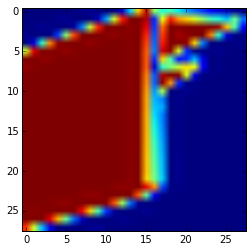

(1, 'true value', 'G', 'prediction value', 'D')


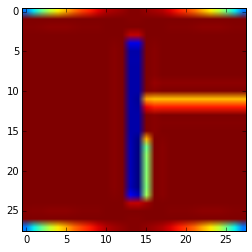

(2, 'true value', 'C', 'prediction value', 'F')


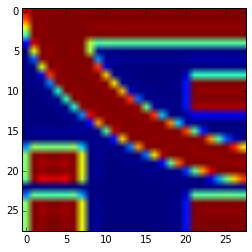

(3, 'true value', 'J', 'prediction value', 'I')


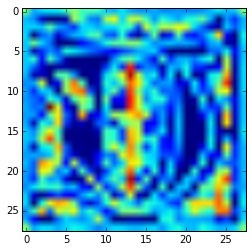

(4, 'true value', 'C', 'prediction value', 'E')


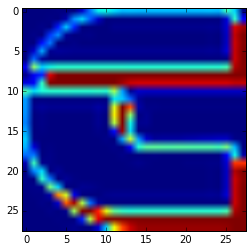

(5, 'true value', 'H', 'prediction value', 'D')


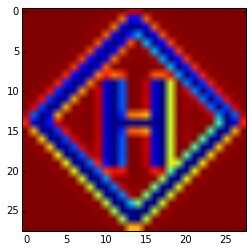

(6, 'true value', 'B', 'prediction value', 'C')


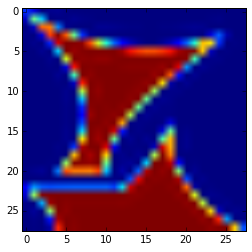

(7, 'true value', 'E', 'prediction value', 'A')


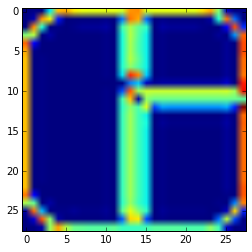

(8, 'true value', 'H', 'prediction value', 'I')


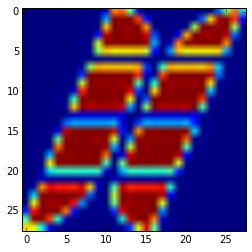

(9, 'true value', 'G', 'prediction value', 'A')


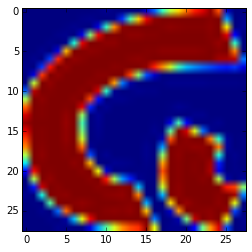

(10, 'true value', 'I', 'prediction value', 'J')


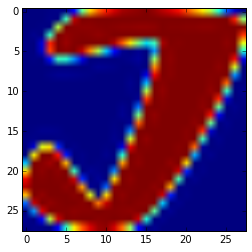

(11, 'true value', 'F', 'prediction value', 'I')


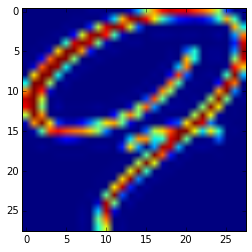

(12, 'true value', 'B', 'prediction value', 'J')


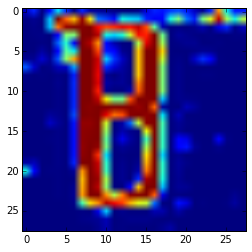

(13, 'true value', 'I', 'prediction value', 'J')


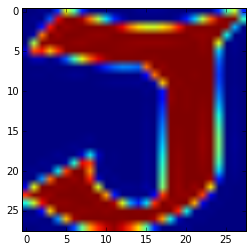

(14, 'true value', 'E', 'prediction value', 'J')


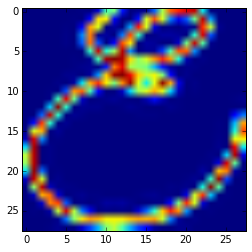

(15, 'true value', 'E', 'prediction value', 'J')


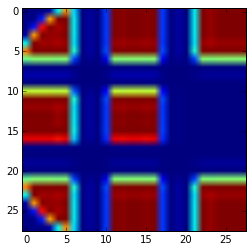

(16, 'true value', 'J', 'prediction value', 'B')


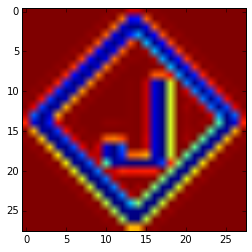

(17, 'true value', 'F', 'prediction value', 'E')


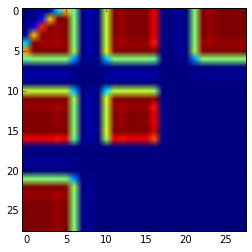

(18, 'true value', 'J', 'prediction value', 'A')


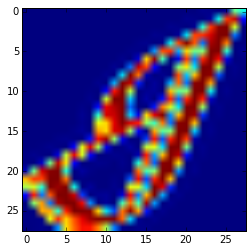

(19, 'true value', 'E', 'prediction value', 'H')


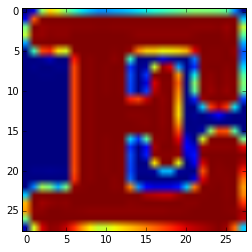

(20, 'true value', 'B', 'prediction value', 'E')


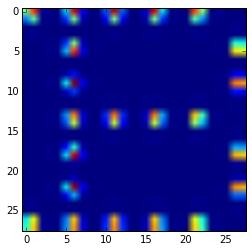

(21, 'true value', 'E', 'prediction value', 'B')


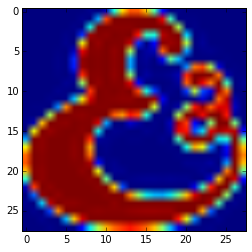

(22, 'true value', 'J', 'prediction value', 'D')


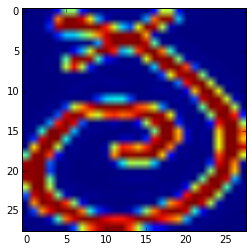

(23, 'true value', 'B', 'prediction value', 'A')


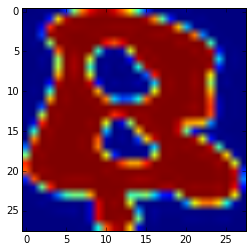

(24, 'true value', 'A', 'prediction value', 'D')


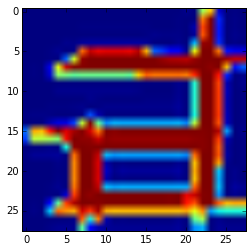

(25, 'true value', 'B', 'prediction value', 'G')


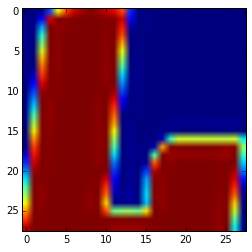

(26, 'true value', 'F', 'prediction value', 'I')


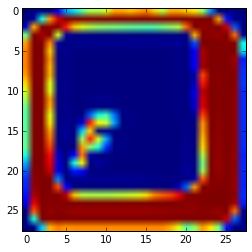

(27, 'true value', 'D', 'prediction value', 'J')


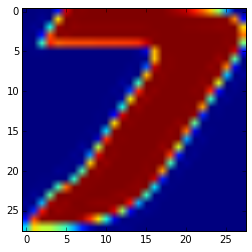

(28, 'true value', 'I', 'prediction value', 'E')


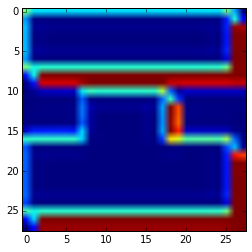

(29, 'true value', 'D', 'prediction value', 'A')


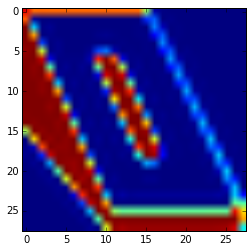

(30, 'true value', 'F', 'prediction value', 'J')


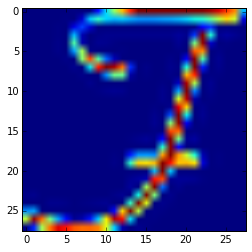

(31, 'true value', 'B', 'prediction value', 'D')


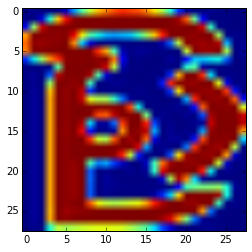

(32, 'true value', 'B', 'prediction value', 'H')


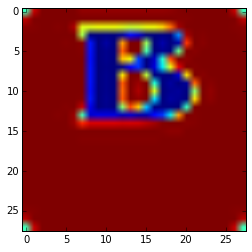

(33, 'true value', 'I', 'prediction value', 'J')


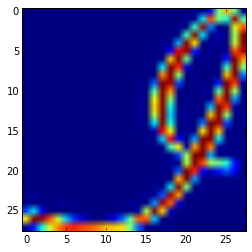

(34, 'true value', 'C', 'prediction value', 'G')


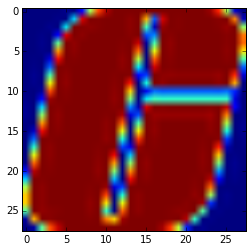

(35, 'true value', 'G', 'prediction value', 'C')


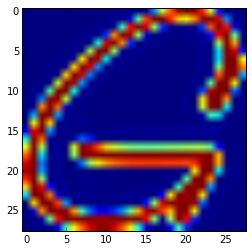

(36, 'true value', 'I', 'prediction value', 'C')


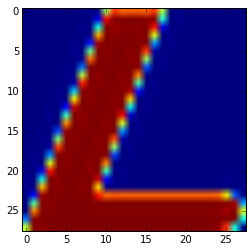

(37, 'true value', 'B', 'prediction value', 'A')


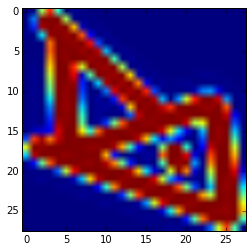

(38, 'true value', 'E', 'prediction value', 'G')


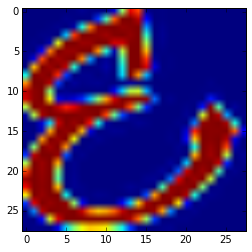

(39, 'true value', 'I', 'prediction value', 'D')


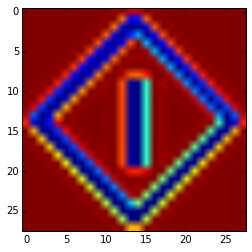

(40, 'true value', 'D', 'prediction value', 'J')


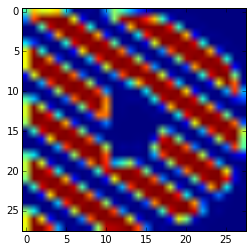

(41, 'true value', 'H', 'prediction value', 'A')


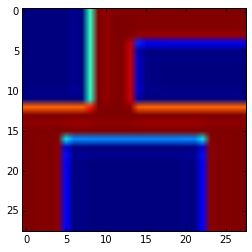

(42, 'true value', 'H', 'prediction value', 'I')


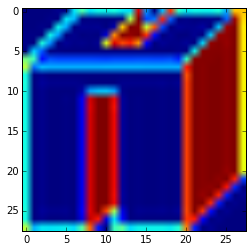

(43, 'true value', 'D', 'prediction value', 'I')


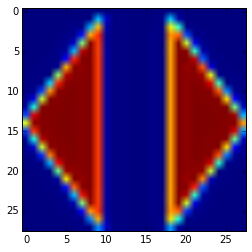

(44, 'true value', 'E', 'prediction value', 'F')


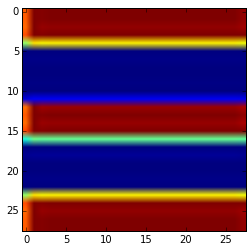

(45, 'true value', 'J', 'prediction value', 'D')


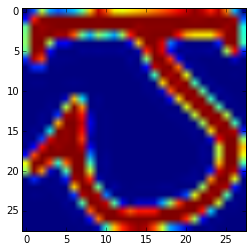

(46, 'true value', 'E', 'prediction value', 'B')


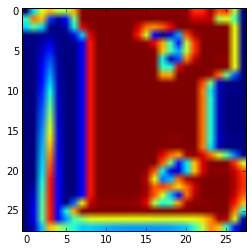

(47, 'true value', 'G', 'prediction value', 'I')


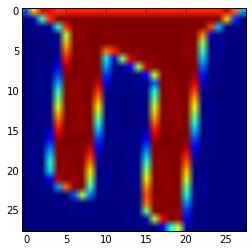

(48, 'true value', 'A', 'prediction value', 'E')


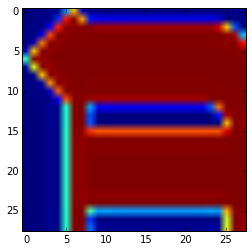

(49, 'true value', 'I', 'prediction value', 'A')


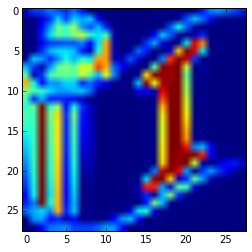

(50, 'true value', 'E', 'prediction value', 'F')


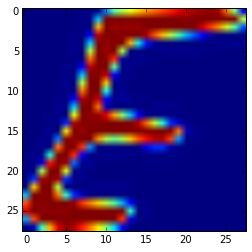

(51, 'true value', 'E', 'prediction value', 'B')


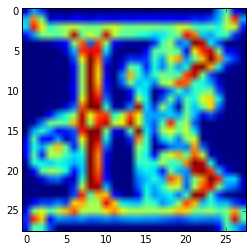

(52, 'true value', 'A', 'prediction value', 'D')


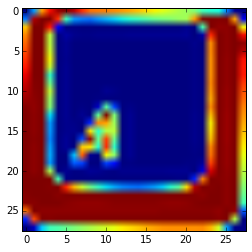

(53, 'true value', 'G', 'prediction value', 'C')


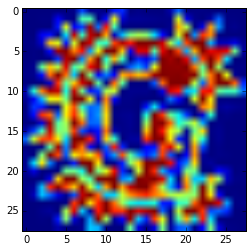

(54, 'true value', 'E', 'prediction value', 'G')


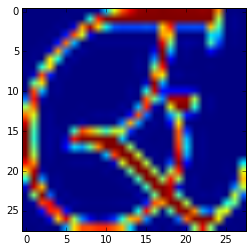

(55, 'true value', 'J', 'prediction value', 'I')


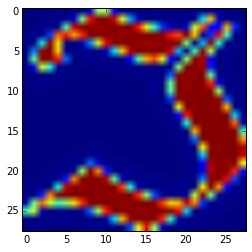

(56, 'true value', 'B', 'prediction value', 'I')


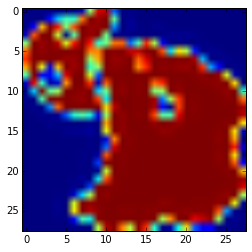

(57, 'true value', 'E', 'prediction value', 'B')


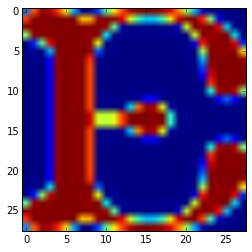

(58, 'true value', 'F', 'prediction value', 'I')


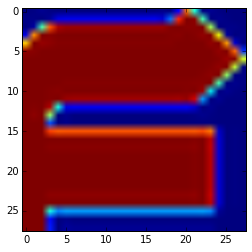

(59, 'true value', 'C', 'prediction value', 'G')


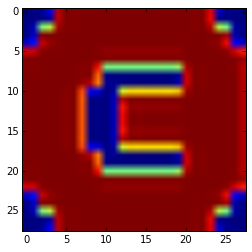

(60, 'true value', 'D', 'prediction value', 'J')


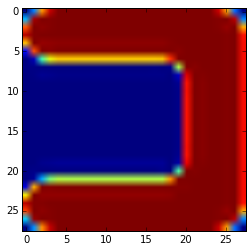

(61, 'true value', 'A', 'prediction value', 'G')


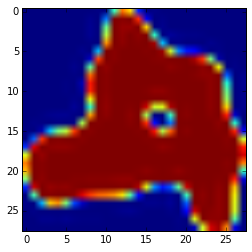

(62, 'true value', 'C', 'prediction value', 'G')


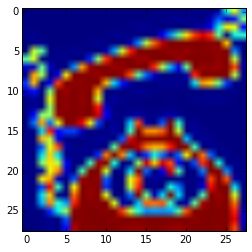

(63, 'true value', 'E', 'prediction value', 'F')


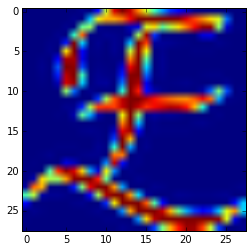

(64, 'true value', 'I', 'prediction value', 'B')


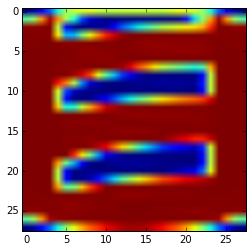

(65, 'true value', 'A', 'prediction value', 'E')


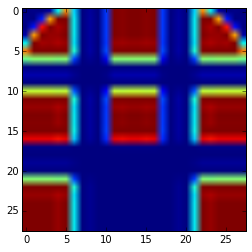

(66, 'true value', 'J', 'prediction value', 'B')


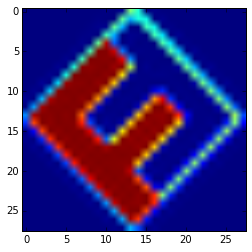

(67, 'true value', 'I', 'prediction value', 'G')


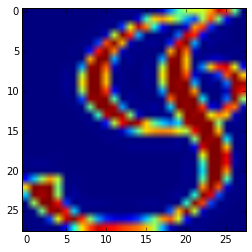

(68, 'true value', 'F', 'prediction value', 'B')


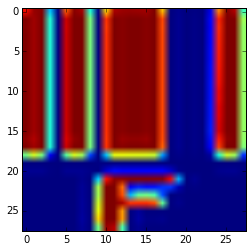

(69, 'true value', 'I', 'prediction value', 'G')


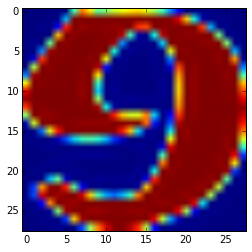

(70, 'true value', 'D', 'prediction value', 'J')


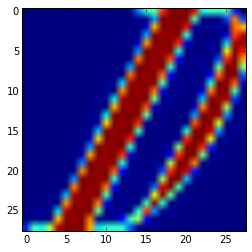

(71, 'true value', 'F', 'prediction value', 'E')


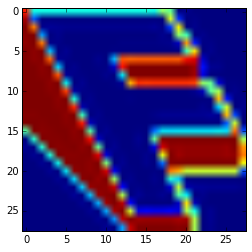

(72, 'true value', 'C', 'prediction value', 'J')


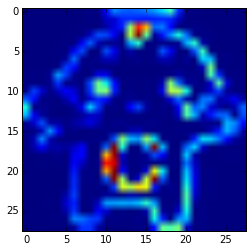

(73, 'true value', 'G', 'prediction value', 'A')


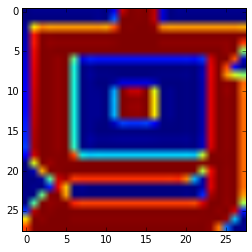

(74, 'true value', 'C', 'prediction value', 'G')


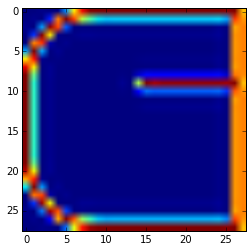

(75, 'true value', 'I', 'prediction value', 'F')


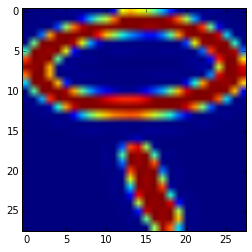

(76, 'true value', 'E', 'prediction value', 'C')


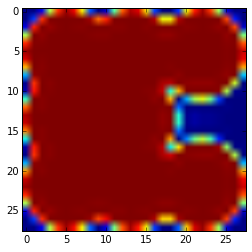

(77, 'true value', 'B', 'prediction value', 'A')


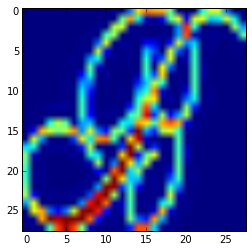

(78, 'true value', 'H', 'prediction value', 'I')


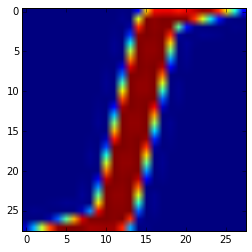

(79, 'true value', 'J', 'prediction value', 'I')


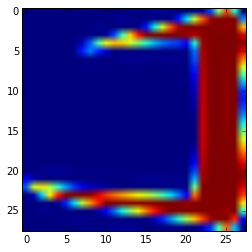

(80, 'true value', 'I', 'prediction value', 'D')


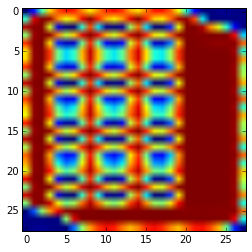

(81, 'true value', 'H', 'prediction value', 'I')


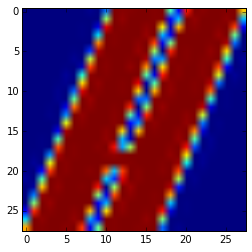

(82, 'true value', 'C', 'prediction value', 'D')


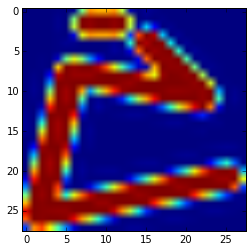

(83, 'true value', 'J', 'prediction value', 'D')


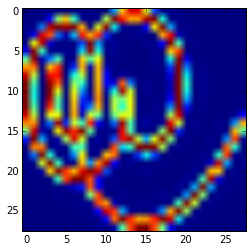

(84, 'true value', 'G', 'prediction value', 'C')


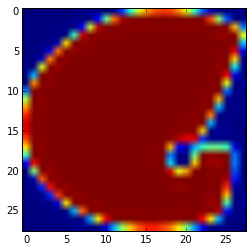

(85, 'true value', 'C', 'prediction value', 'I')


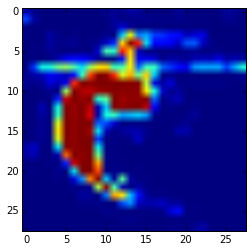

(86, 'true value', 'I', 'prediction value', 'B')


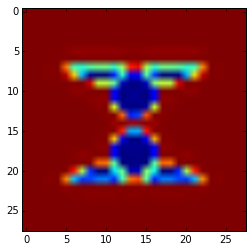

(87, 'true value', 'A', 'prediction value', 'I')


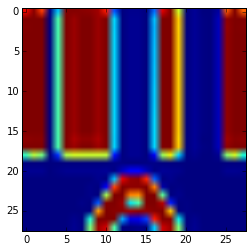

(88, 'true value', 'I', 'prediction value', 'E')


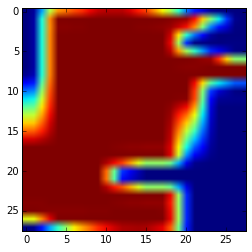

(89, 'true value', 'H', 'prediction value', 'A')


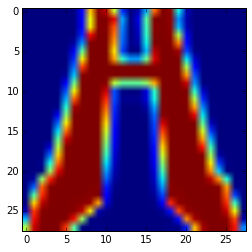

(90, 'true value', 'A', 'prediction value', 'G')


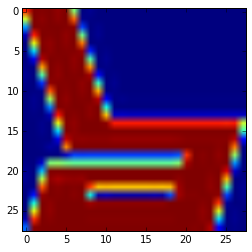

(91, 'true value', 'J', 'prediction value', 'I')


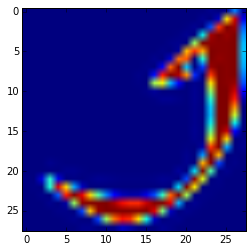

(92, 'true value', 'J', 'prediction value', 'I')


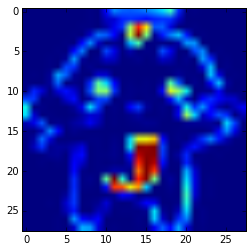

(93, 'true value', 'H', 'prediction value', 'J')


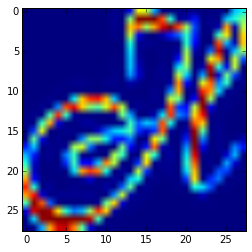

(94, 'true value', 'G', 'prediction value', 'C')


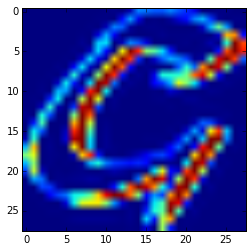

(95, 'true value', 'G', 'prediction value', 'F')


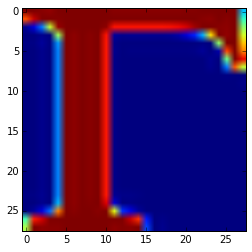

(96, 'true value', 'H', 'prediction value', 'A')


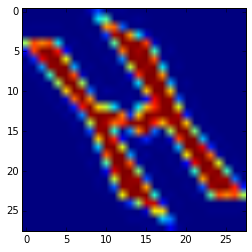

(97, 'true value', 'I', 'prediction value', 'J')


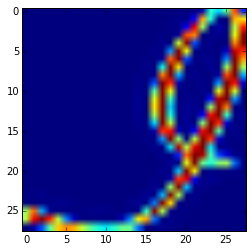

(98, 'true value', 'C', 'prediction value', 'D')


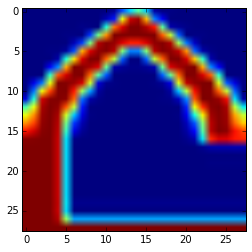

(99, 'true value', 'J', 'prediction value', 'D')


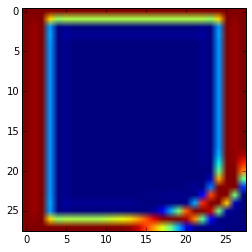

(100, 'true value', 'C', 'prediction value', 'G')


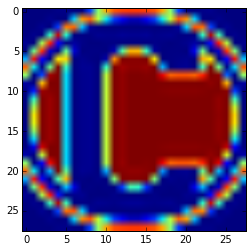

(101, 'true value', 'G', 'prediction value', 'D')


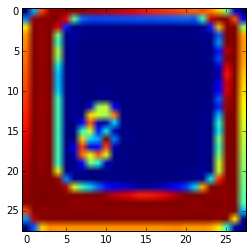

(102, 'true value', 'F', 'prediction value', 'I')


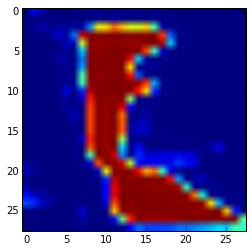

(103, 'true value', 'E', 'prediction value', 'F')


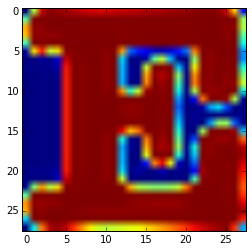

(104, 'true value', 'I', 'prediction value', 'J')


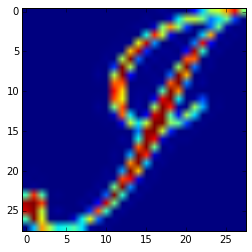

(105, 'true value', 'B', 'prediction value', 'H')


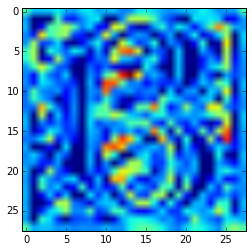

(106, 'true value', 'A', 'prediction value', 'D')


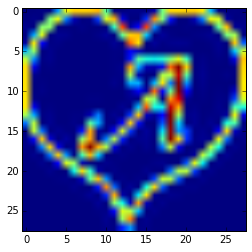

(107, 'true value', 'E', 'prediction value', 'C')


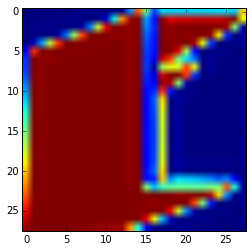

(108, 'true value', 'A', 'prediction value', 'J')


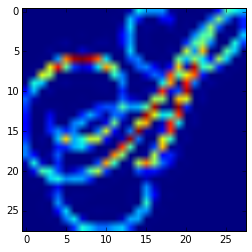

(109, 'true value', 'E', 'prediction value', 'F')


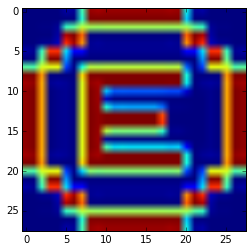

(110, 'true value', 'B', 'prediction value', 'H')


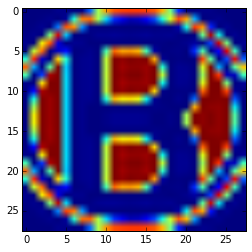

(111, 'true value', 'E', 'prediction value', 'F')


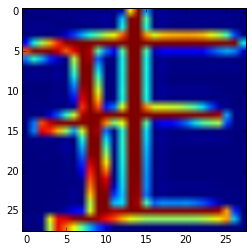

(112, 'true value', 'J', 'prediction value', 'I')


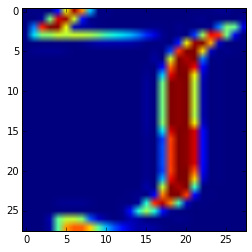

(113, 'true value', 'C', 'prediction value', 'G')


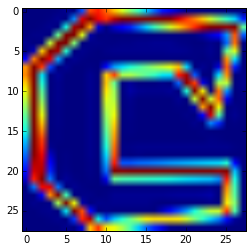

(114, 'true value', 'G', 'prediction value', 'C')


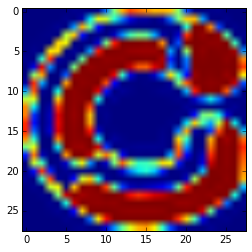

(115, 'true value', 'D', 'prediction value', 'A')


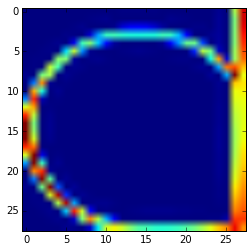

(116, 'true value', 'C', 'prediction value', 'G')


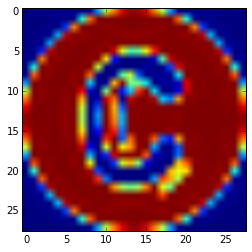

(117, 'true value', 'J', 'prediction value', 'C')


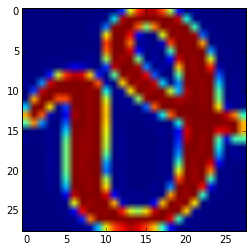

(118, 'true value', 'D', 'prediction value', 'B')


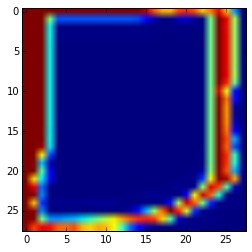

(119, 'true value', 'J', 'prediction value', 'I')


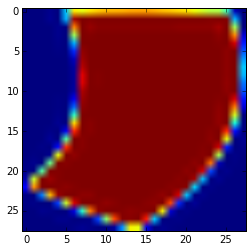

(120, 'true value', 'G', 'prediction value', 'F')


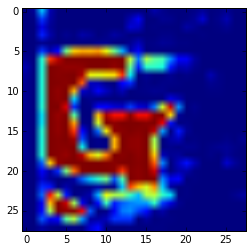

(121, 'true value', 'G', 'prediction value', 'C')


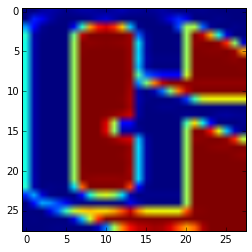

(122, 'true value', 'D', 'prediction value', 'B')


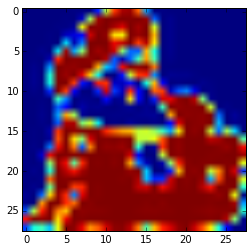

(123, 'true value', 'E', 'prediction value', 'C')


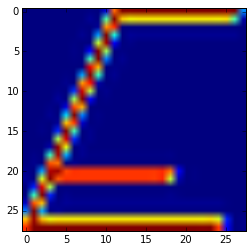

(124, 'true value', 'C', 'prediction value', 'E')


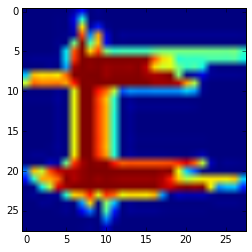

(125, 'true value', 'I', 'prediction value', 'G')


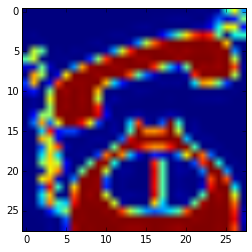

(126, 'true value', 'I', 'prediction value', 'D')


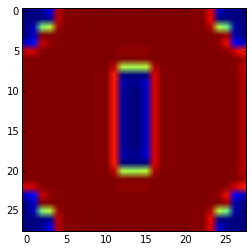

(127, 'true value', 'I', 'prediction value', 'D')


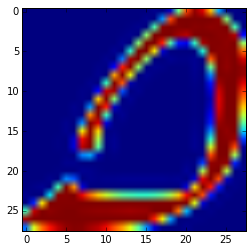

(128, 'true value', 'B', 'prediction value', 'A')


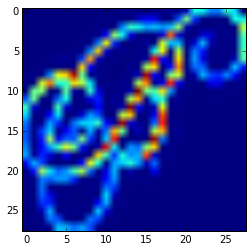

(129, 'true value', 'E', 'prediction value', 'I')


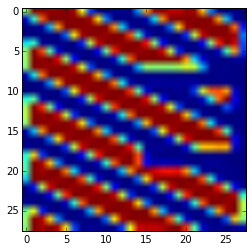

(130, 'true value', 'E', 'prediction value', 'G')


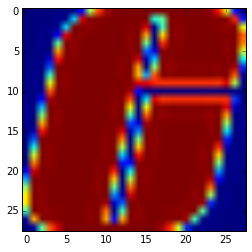

(131, 'true value', 'E', 'prediction value', 'F')


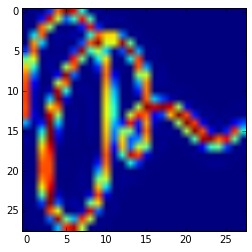

(132, 'true value', 'A', 'prediction value', 'F')


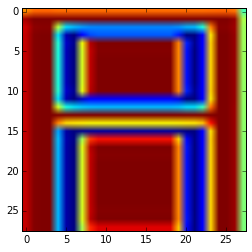

(133, 'true value', 'I', 'prediction value', 'J')


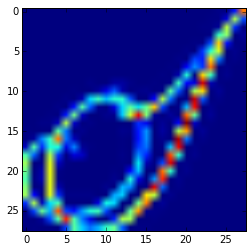

(134, 'true value', 'G', 'prediction value', 'A')


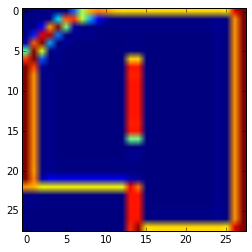

(135, 'true value', 'H', 'prediction value', 'F')


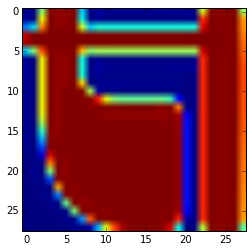

(136, 'true value', 'H', 'prediction value', 'J')


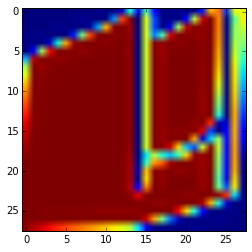

(137, 'true value', 'C', 'prediction value', 'G')


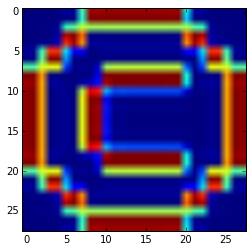

(138, 'true value', 'G', 'prediction value', 'C')


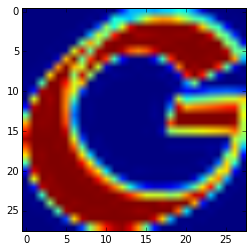

(139, 'true value', 'I', 'prediction value', 'G')


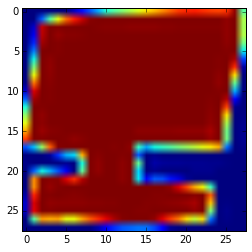

(140, 'true value', 'C', 'prediction value', 'E')


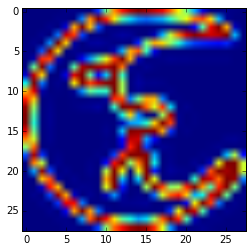

(141, 'true value', 'D', 'prediction value', 'B')


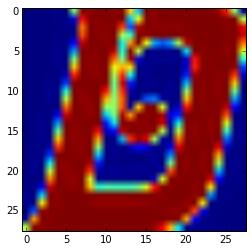

(142, 'true value', 'G', 'prediction value', 'F')


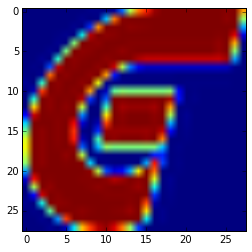

(143, 'true value', 'A', 'prediction value', 'D')


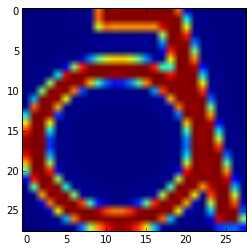

(144, 'true value', 'H', 'prediction value', 'A')


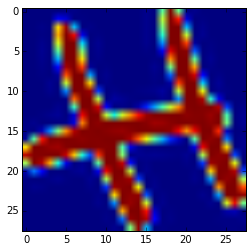

(145, 'true value', 'B', 'prediction value', 'A')


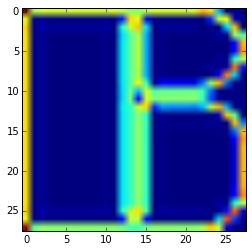

(146, 'true value', 'E', 'prediction value', 'G')


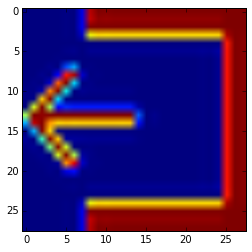

(147, 'true value', 'J', 'prediction value', 'I')


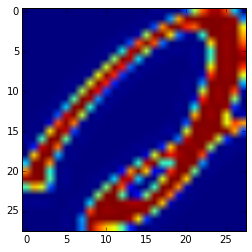

(148, 'true value', 'F', 'prediction value', 'E')


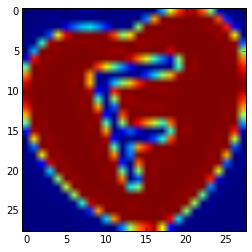

(149, 'true value', 'F', 'prediction value', 'A')


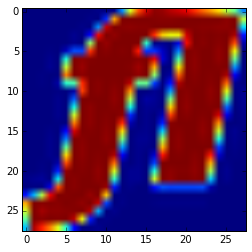

(150, 'true value', 'C', 'prediction value', 'E')


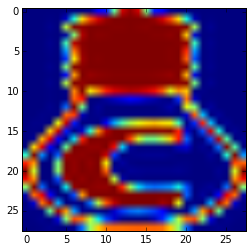

(151, 'true value', 'I', 'prediction value', 'J')


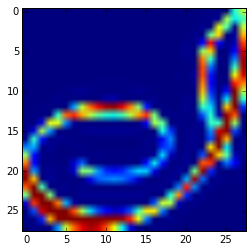

(152, 'true value', 'B', 'prediction value', 'G')


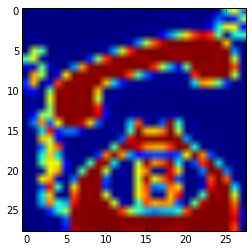

(153, 'true value', 'A', 'prediction value', 'H')


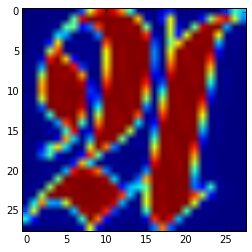

(154, 'true value', 'C', 'prediction value', 'B')


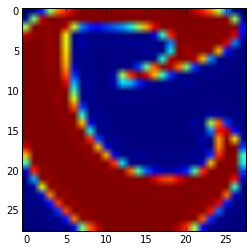

(155, 'true value', 'D', 'prediction value', 'F')


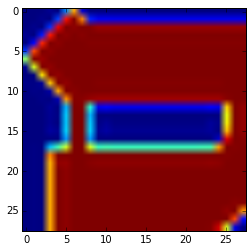

(156, 'true value', 'A', 'prediction value', 'D')


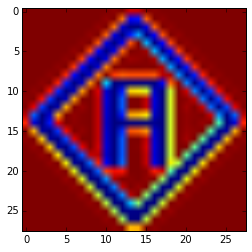

(157, 'true value', 'C', 'prediction value', 'G')


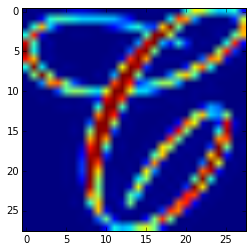

(158, 'true value', 'I', 'prediction value', 'J')


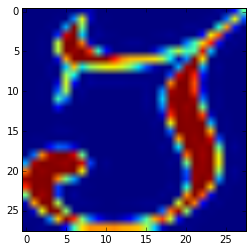

(159, 'true value', 'G', 'prediction value', 'B')


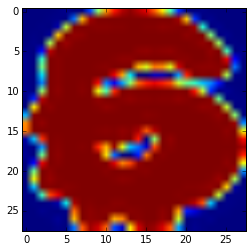

(160, 'true value', 'B', 'prediction value', 'C')


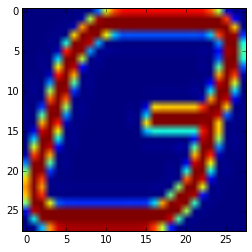

(161, 'true value', 'E', 'prediction value', 'A')


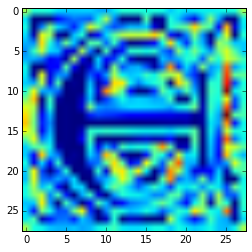

(162, 'true value', 'H', 'prediction value', 'I')


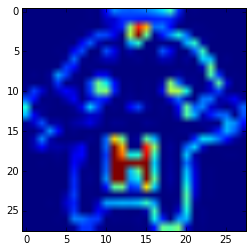

(163, 'true value', 'C', 'prediction value', 'G')


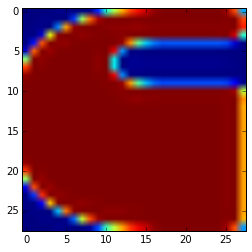

(164, 'true value', 'J', 'prediction value', 'B')


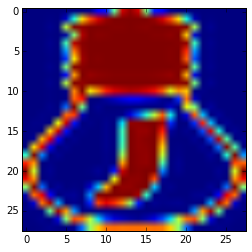

(165, 'true value', 'J', 'prediction value', 'D')


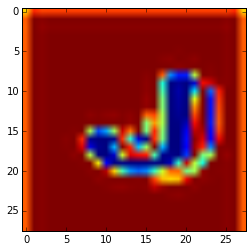

(166, 'true value', 'H', 'prediction value', 'A')


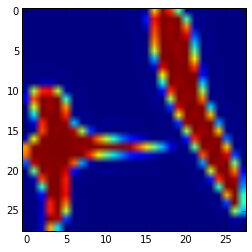

(167, 'true value', 'G', 'prediction value', 'E')


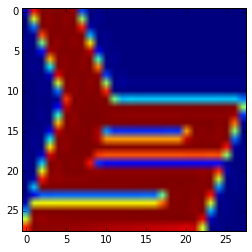

(168, 'true value', 'G', 'prediction value', 'F')


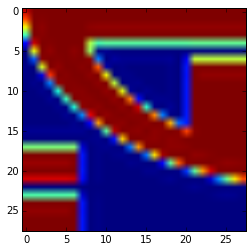

(169, 'true value', 'F', 'prediction value', 'D')


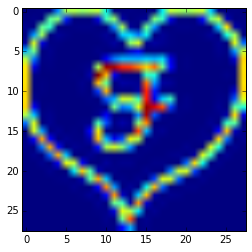

(170, 'true value', 'H', 'prediction value', 'B')


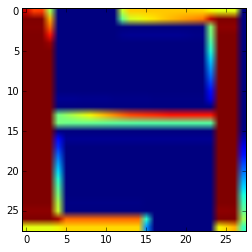

(171, 'true value', 'G', 'prediction value', 'C')


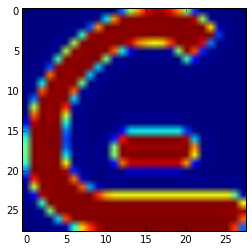

(172, 'true value', 'I', 'prediction value', 'D')


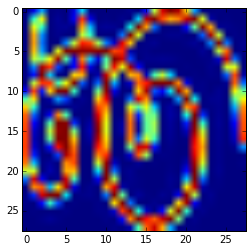

(173, 'true value', 'J', 'prediction value', 'A')


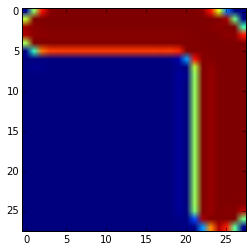

(174, 'true value', 'E', 'prediction value', 'G')


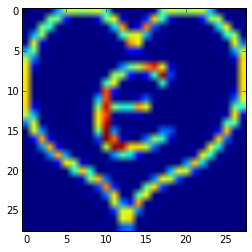

(175, 'true value', 'F', 'prediction value', 'J')


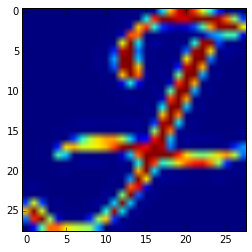

(176, 'true value', 'I', 'prediction value', 'J')


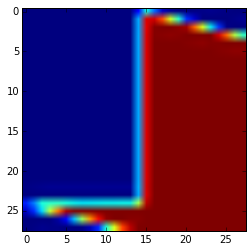

(177, 'true value', 'H', 'prediction value', 'A')


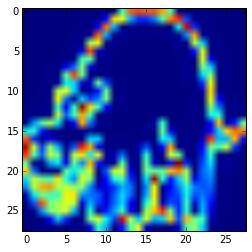

(178, 'true value', 'G', 'prediction value', 'J')


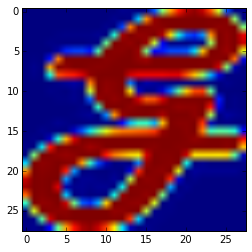

(179, 'true value', 'G', 'prediction value', 'D')


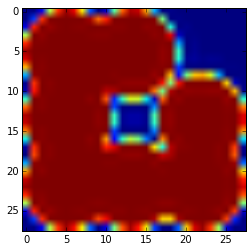

(180, 'true value', 'I', 'prediction value', 'J')


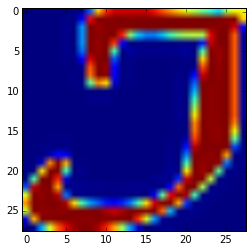

(181, 'true value', 'I', 'prediction value', 'J')


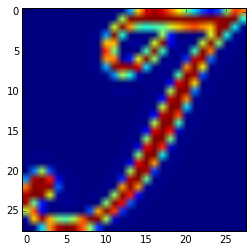

(182, 'true value', 'E', 'prediction value', 'C')


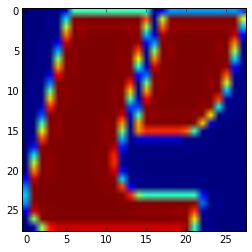

(183, 'true value', 'C', 'prediction value', 'G')


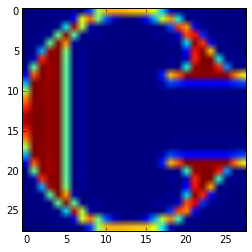

(184, 'true value', 'I', 'prediction value', 'J')


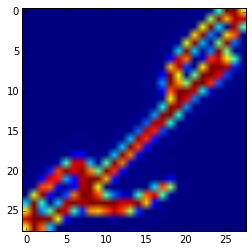

(185, 'true value', 'I', 'prediction value', 'D')


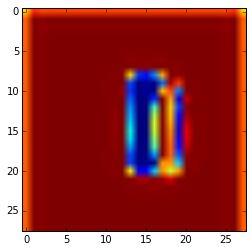

(186, 'true value', 'C', 'prediction value', 'E')


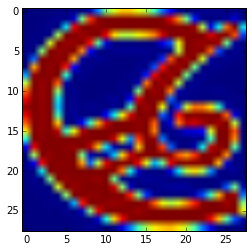

(187, 'true value', 'I', 'prediction value', 'A')


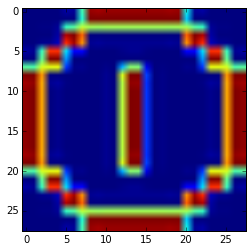

(188, 'true value', 'I', 'prediction value', 'J')


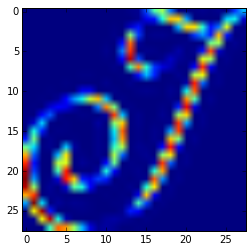

(189, 'true value', 'D', 'prediction value', 'I')


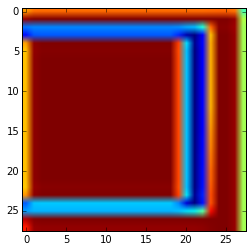

(190, 'true value', 'F', 'prediction value', 'E')


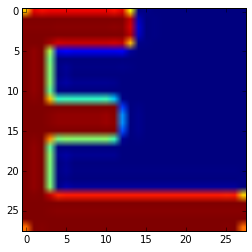

(191, 'true value', 'G', 'prediction value', 'C')


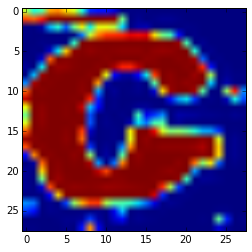

(192, 'true value', 'I', 'prediction value', 'C')


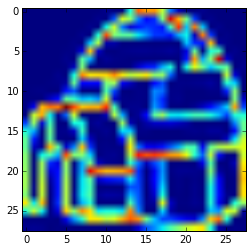

(193, 'true value', 'F', 'prediction value', 'E')


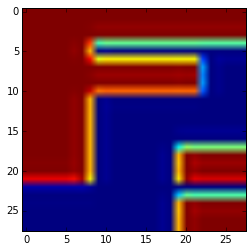

(194, 'true value', 'J', 'prediction value', 'D')


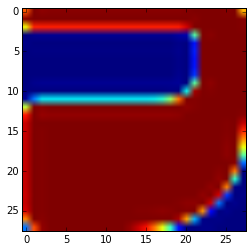

(195, 'true value', 'H', 'prediction value', 'A')


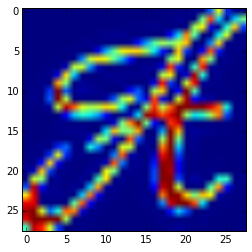

(196, 'true value', 'C', 'prediction value', 'F')


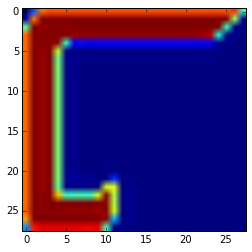

(197, 'true value', 'C', 'prediction value', 'F')


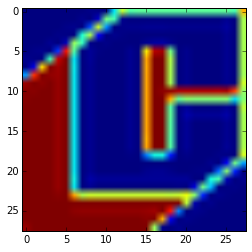

(198, 'true value', 'E', 'prediction value', 'F')


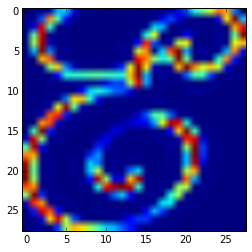

(199, 'true value', 'E', 'prediction value', 'C')


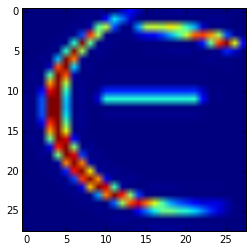

(200, 'true value', 'A', 'prediction value', 'B')


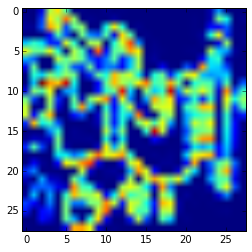

(201, 'true value', 'B', 'prediction value', 'H')


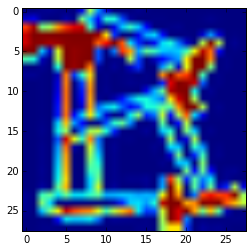

(202, 'true value', 'J', 'prediction value', 'H')


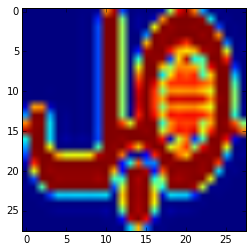

(203, 'true value', 'A', 'prediction value', 'I')


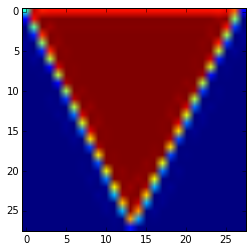

(204, 'true value', 'I', 'prediction value', 'D')


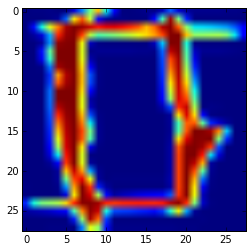

(205, 'true value', 'I', 'prediction value', 'A')


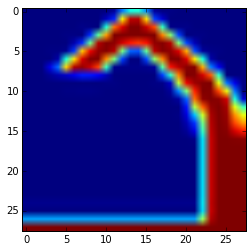

(206, 'true value', 'B', 'prediction value', 'F')


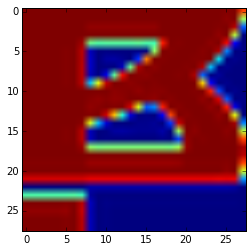

(207, 'true value', 'I', 'prediction value', 'J')


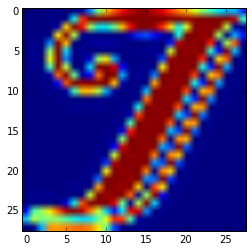

(208, 'true value', 'E', 'prediction value', 'J')


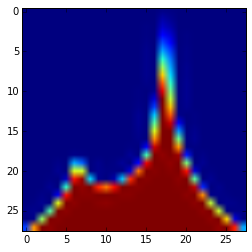

(209, 'true value', 'C', 'prediction value', 'G')


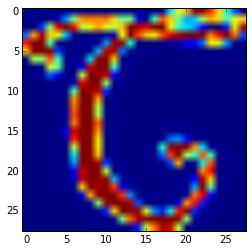

(210, 'true value', 'E', 'prediction value', 'I')


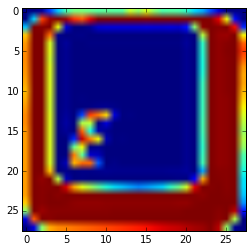

(211, 'true value', 'J', 'prediction value', 'I')


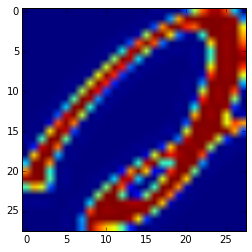

(212, 'true value', 'J', 'prediction value', 'E')


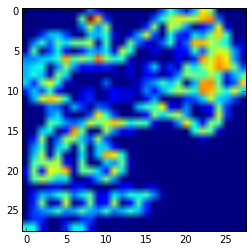

(213, 'true value', 'F', 'prediction value', 'E')


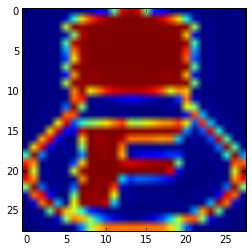

(214, 'true value', 'H', 'prediction value', 'J')


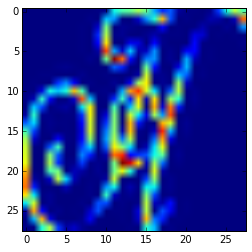

(215, 'true value', 'I', 'prediction value', 'J')


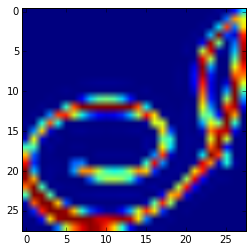

(216, 'true value', 'H', 'prediction value', 'B')


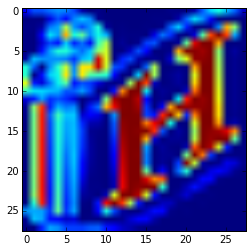

(217, 'true value', 'I', 'prediction value', 'G')


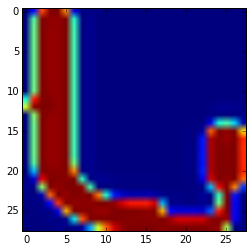

(218, 'true value', 'C', 'prediction value', 'G')


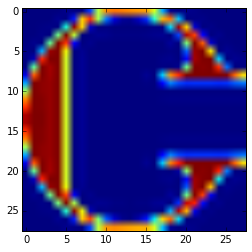

(219, 'true value', 'G', 'prediction value', 'F')


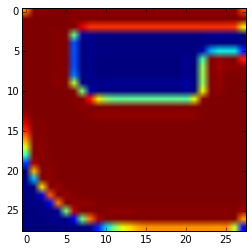

(220, 'true value', 'C', 'prediction value', 'G')


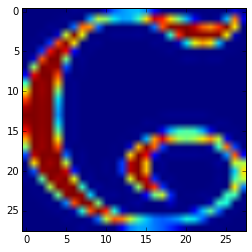

(221, 'true value', 'B', 'prediction value', 'D')


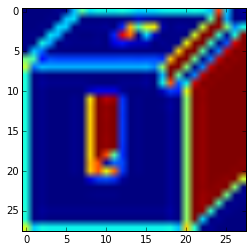

(222, 'true value', 'J', 'prediction value', 'D')


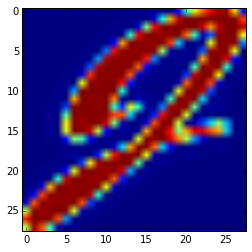

(223, 'true value', 'E', 'prediction value', 'I')


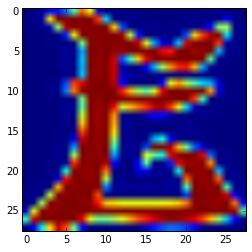

(224, 'true value', 'E', 'prediction value', 'J')


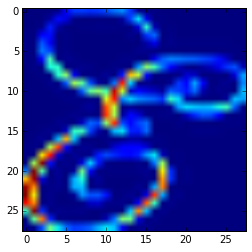

(225, 'true value', 'D', 'prediction value', 'B')


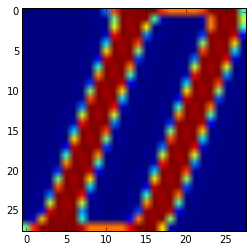

(226, 'true value', 'B', 'prediction value', 'I')


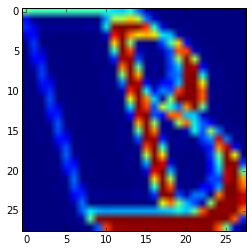

(227, 'true value', 'B', 'prediction value', 'D')


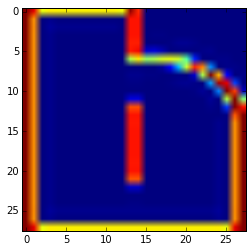

(228, 'true value', 'J', 'prediction value', 'C')


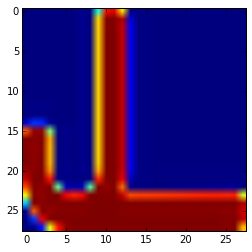

(229, 'true value', 'I', 'prediction value', 'D')


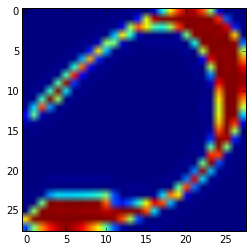

(230, 'true value', 'E', 'prediction value', 'F')


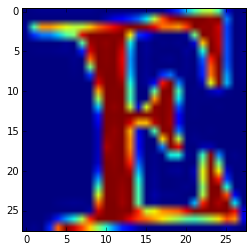

(231, 'true value', 'J', 'prediction value', 'I')


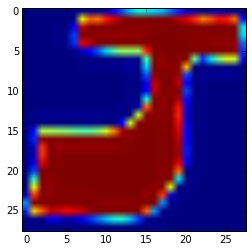

(232, 'true value', 'C', 'prediction value', 'G')


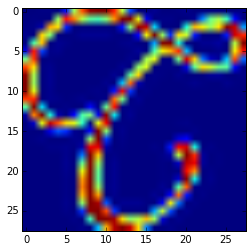

(233, 'true value', 'F', 'prediction value', 'I')


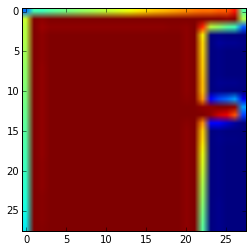

(234, 'true value', 'I', 'prediction value', 'J')


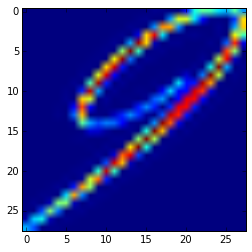

(235, 'true value', 'A', 'prediction value', 'B')


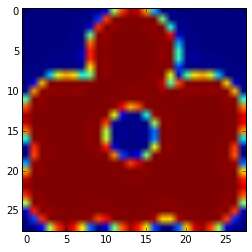

(236, 'true value', 'C', 'prediction value', 'B')


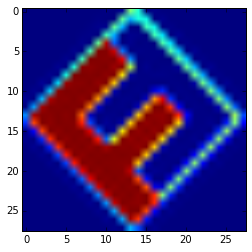

(237, 'true value', 'G', 'prediction value', 'J')


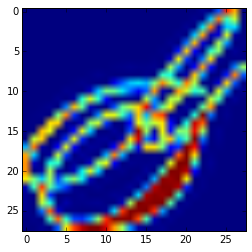

(238, 'true value', 'E', 'prediction value', 'G')


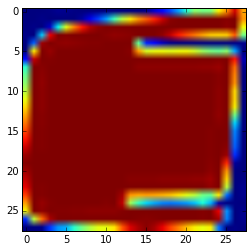

(239, 'true value', 'J', 'prediction value', 'I')


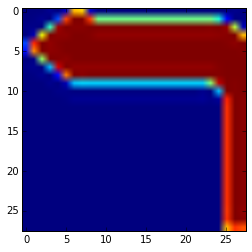

(240, 'true value', 'A', 'prediction value', 'H')


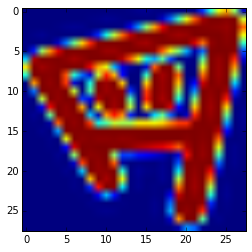

(241, 'true value', 'H', 'prediction value', 'F')


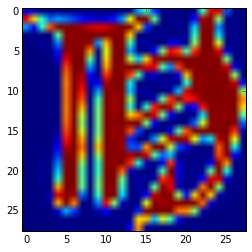

(242, 'true value', 'I', 'prediction value', 'J')


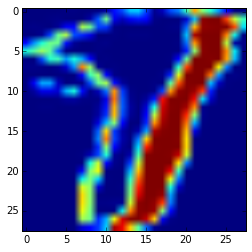

(243, 'true value', 'C', 'prediction value', 'G')


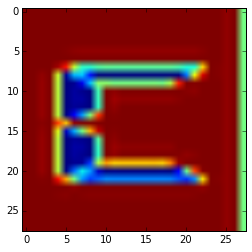

(244, 'true value', 'H', 'prediction value', 'D')


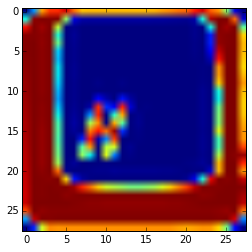

(245, 'true value', 'B', 'prediction value', 'G')


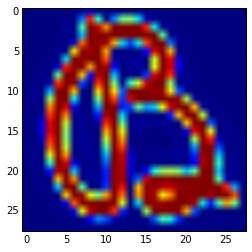

(246, 'true value', 'I', 'prediction value', 'A')


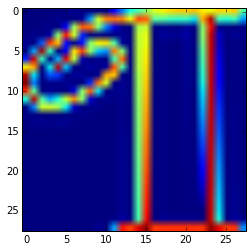

(247, 'true value', 'J', 'prediction value', 'I')


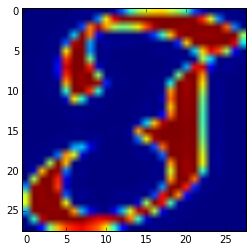

(248, 'true value', 'C', 'prediction value', 'G')


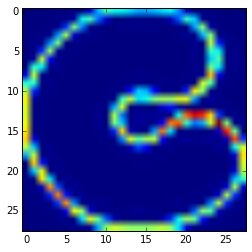

(249, 'true value', 'C', 'prediction value', 'G')


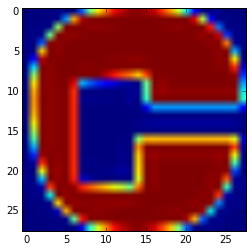

(250, 'true value', 'F', 'prediction value', 'E')


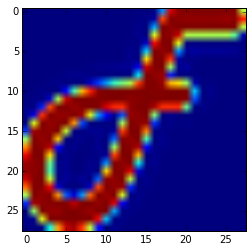

(251, 'true value', 'I', 'prediction value', 'J')


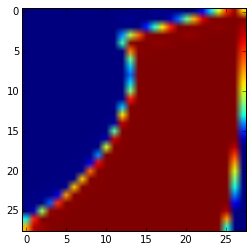

(252, 'true value', 'D', 'prediction value', 'I')


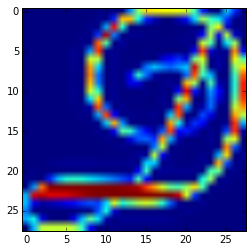

(253, 'true value', 'F', 'prediction value', 'J')


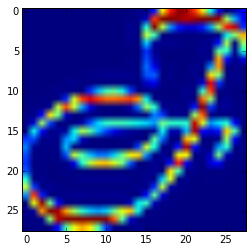

(254, 'true value', 'F', 'prediction value', 'E')


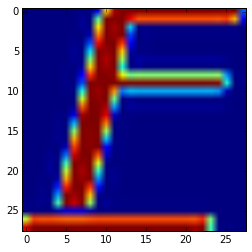

(255, 'true value', 'I', 'prediction value', 'J')


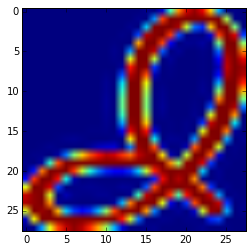

(256, 'true value', 'C', 'prediction value', 'G')


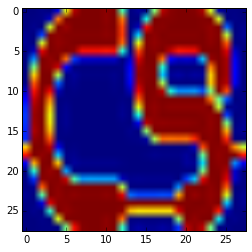

(257, 'true value', 'H', 'prediction value', 'G')


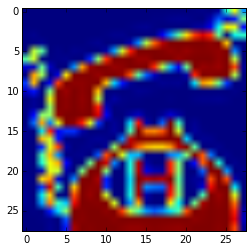

(258, 'true value', 'E', 'prediction value', 'B')


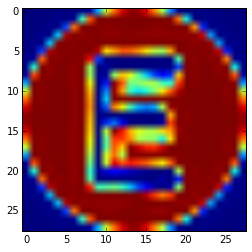

(259, 'true value', 'B', 'prediction value', 'D')


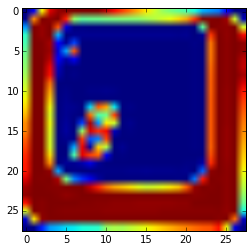

(260, 'true value', 'G', 'prediction value', 'B')


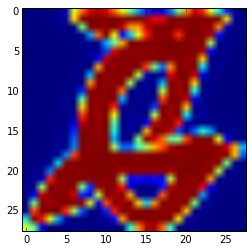

(261, 'true value', 'J', 'prediction value', 'I')


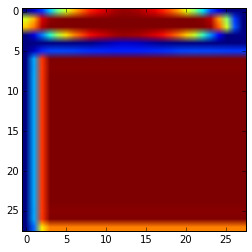

(262, 'true value', 'B', 'prediction value', 'J')


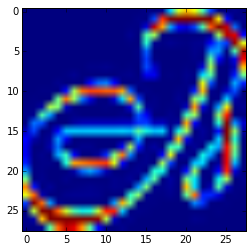

(263, 'true value', 'F', 'prediction value', 'J')


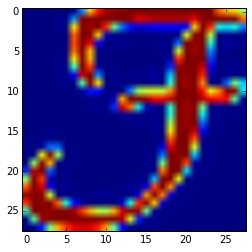

(264, 'true value', 'H', 'prediction value', 'D')


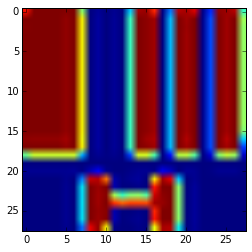

(265, 'true value', 'J', 'prediction value', 'I')


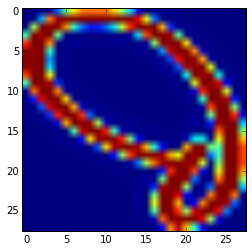

(266, 'true value', 'E', 'prediction value', 'F')


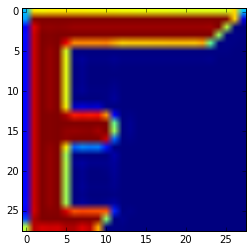

(267, 'true value', 'F', 'prediction value', 'D')


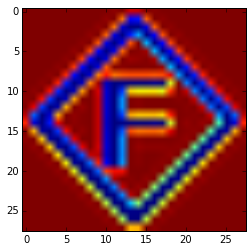

(268, 'true value', 'F', 'prediction value', 'J')


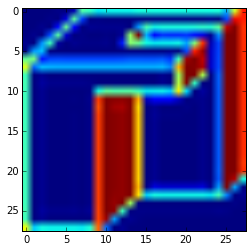

(269, 'true value', 'J', 'prediction value', 'I')


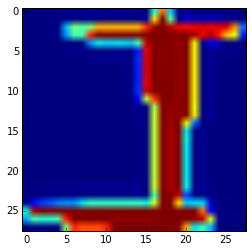

(270, 'true value', 'I', 'prediction value', 'J')


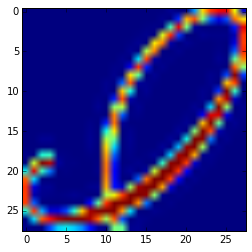

(271, 'true value', 'E', 'prediction value', 'I')


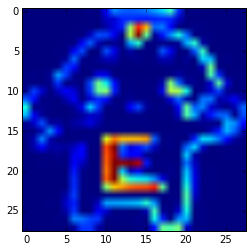

(272, 'true value', 'I', 'prediction value', 'J')


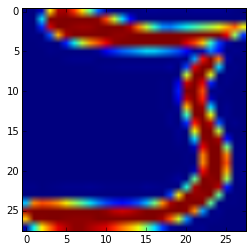

(273, 'true value', 'I', 'prediction value', 'J')


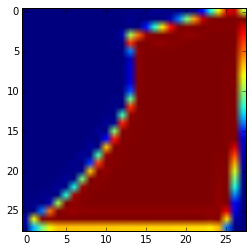

(274, 'true value', 'I', 'prediction value', 'B')


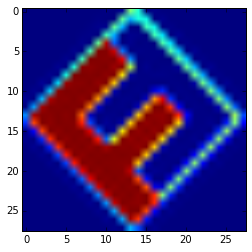

(275, 'true value', 'I', 'prediction value', 'D')


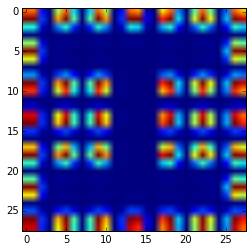

(276, 'true value', 'E', 'prediction value', 'D')


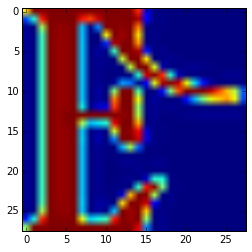

(277, 'true value', 'H', 'prediction value', 'J')


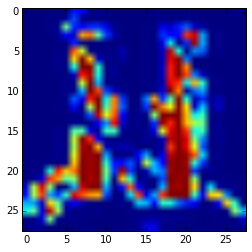

(278, 'true value', 'I', 'prediction value', 'A')


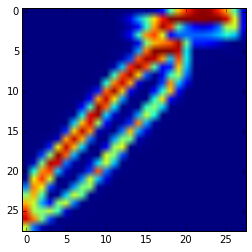

(279, 'true value', 'E', 'prediction value', 'C')


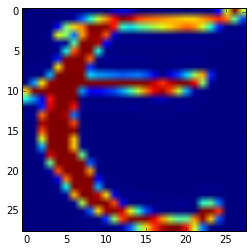

(280, 'true value', 'I', 'prediction value', 'A')


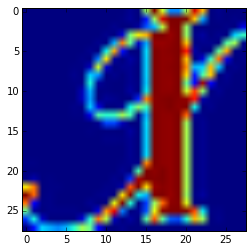

(281, 'true value', 'J', 'prediction value', 'A')


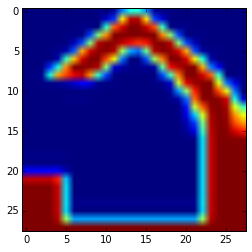

(282, 'true value', 'H', 'prediction value', 'J')


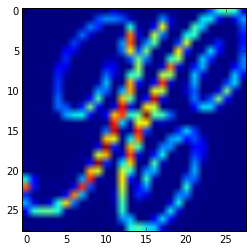

(283, 'true value', 'D', 'prediction value', 'I')


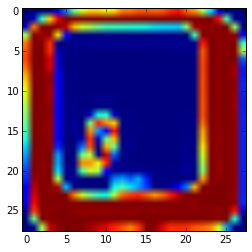

(284, 'true value', 'F', 'prediction value', 'G')


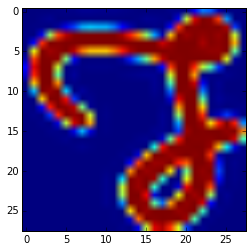

(285, 'true value', 'D', 'prediction value', 'G')


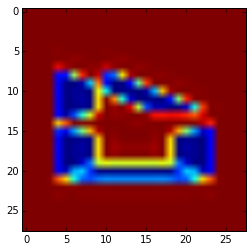

(286, 'true value', 'H', 'prediction value', 'B')


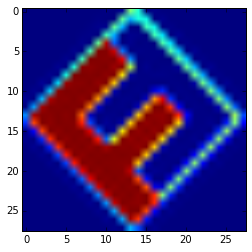

(287, 'true value', 'E', 'prediction value', 'C')


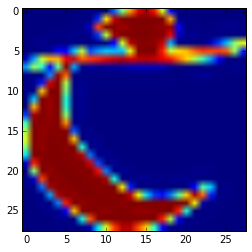

(288, 'true value', 'E', 'prediction value', 'I')


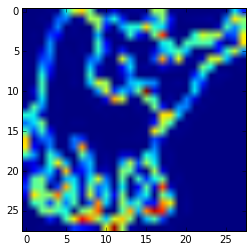

(289, 'true value', 'E', 'prediction value', 'B')


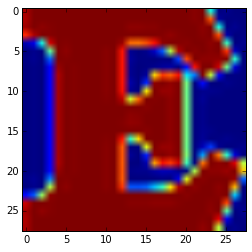

(290, 'true value', 'C', 'prediction value', 'G')


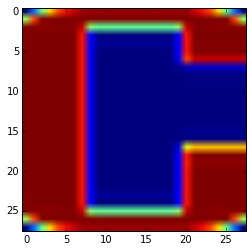

(291, 'true value', 'D', 'prediction value', 'J')


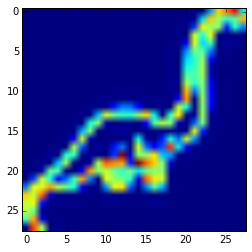

(292, 'true value', 'B', 'prediction value', 'I')


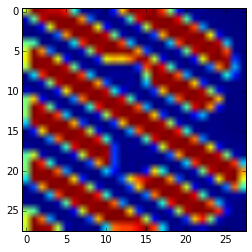

(293, 'true value', 'D', 'prediction value', 'I')


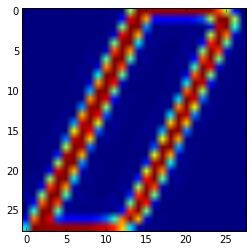

(294, 'true value', 'C', 'prediction value', 'A')


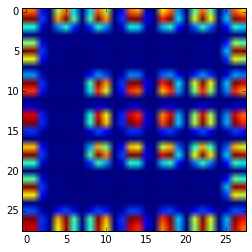

(295, 'true value', 'B', 'prediction value', 'A')


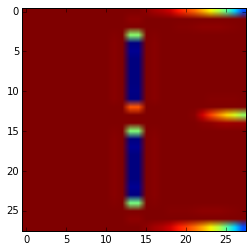

(296, 'true value', 'B', 'prediction value', 'C')


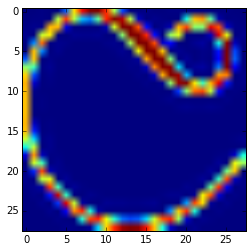

(297, 'true value', 'B', 'prediction value', 'D')


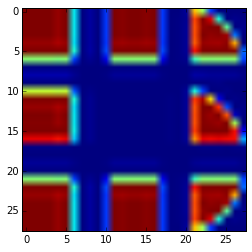

(298, 'true value', 'I', 'prediction value', 'A')


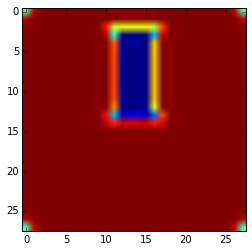

(299, 'true value', 'E', 'prediction value', 'B')


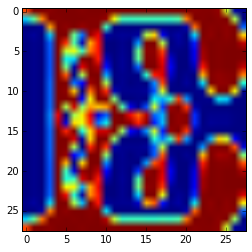

(300, 'true value', 'F', 'prediction value', 'A')


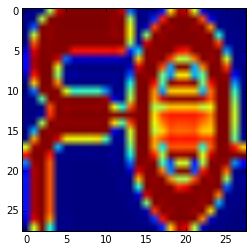

(301, 'true value', 'C', 'prediction value', 'G')


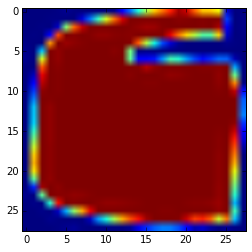

(302, 'true value', 'E', 'prediction value', 'I')


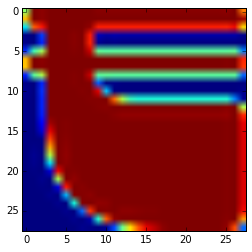

(303, 'true value', 'G', 'prediction value', 'F')


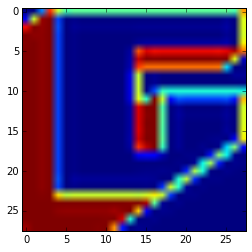

(304, 'true value', 'G', 'prediction value', 'C')


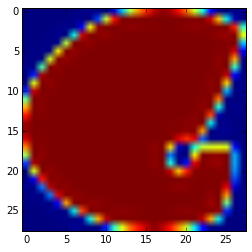

(305, 'true value', 'J', 'prediction value', 'I')


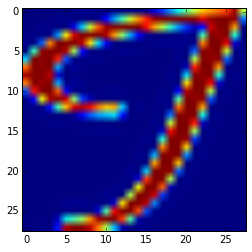

(306, 'true value', 'D', 'prediction value', 'G')


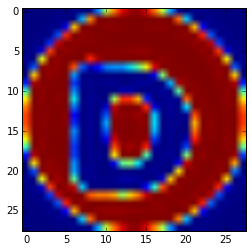

(307, 'true value', 'E', 'prediction value', 'C')


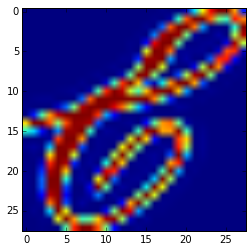

(308, 'true value', 'I', 'prediction value', 'D')


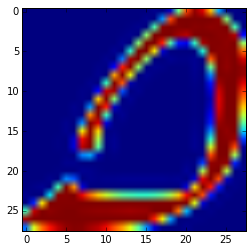

(309, 'true value', 'H', 'prediction value', 'I')


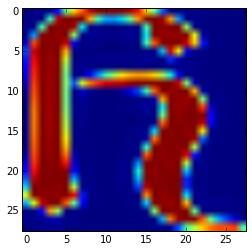

(310, 'true value', 'A', 'prediction value', 'D')


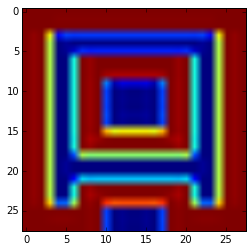

(311, 'true value', 'H', 'prediction value', 'D')


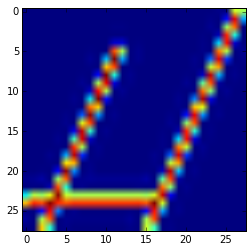

(312, 'true value', 'F', 'prediction value', 'J')


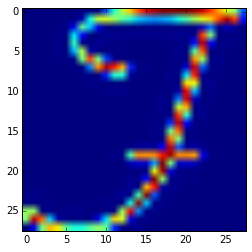

(313, 'true value', 'D', 'prediction value', 'H')


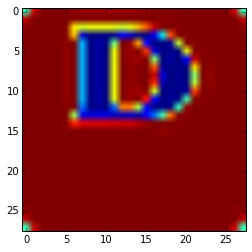

(314, 'true value', 'D', 'prediction value', 'H')


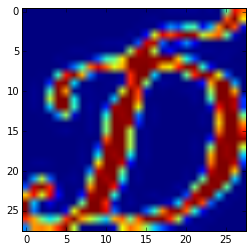

(315, 'true value', 'H', 'prediction value', 'A')


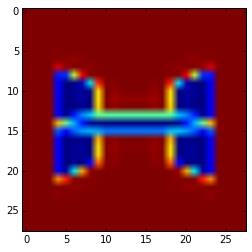

(316, 'true value', 'I', 'prediction value', 'J')


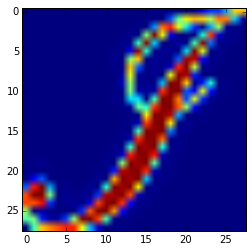

(317, 'true value', 'F', 'prediction value', 'I')


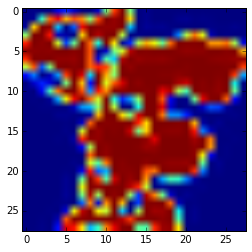

(318, 'true value', 'F', 'prediction value', 'I')


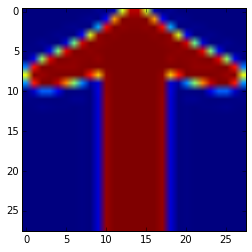

(319, 'true value', 'F', 'prediction value', 'C')


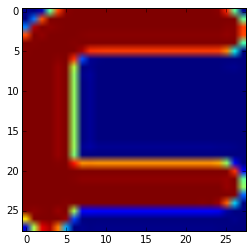

(320, 'true value', 'F', 'prediction value', 'A')


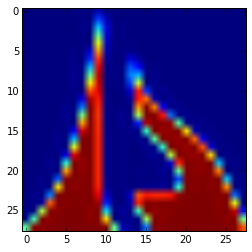

(321, 'true value', 'E', 'prediction value', 'C')


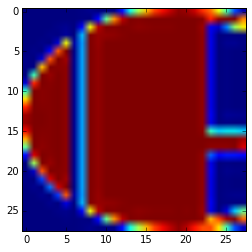

(322, 'true value', 'A', 'prediction value', 'H')


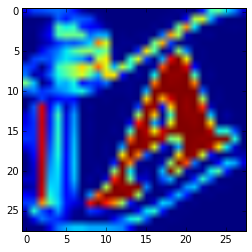

(323, 'true value', 'A', 'prediction value', 'I')


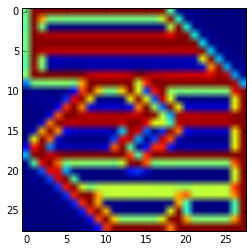

(324, 'true value', 'D', 'prediction value', 'B')


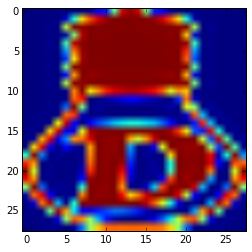

(325, 'true value', 'E', 'prediction value', 'I')


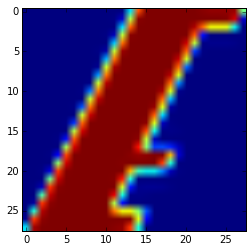

(326, 'true value', 'H', 'prediction value', 'D')


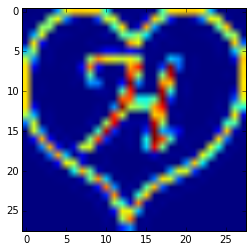

(327, 'true value', 'H', 'prediction value', 'F')


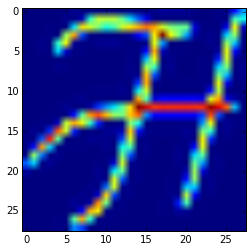

(328, 'true value', 'E', 'prediction value', 'G')


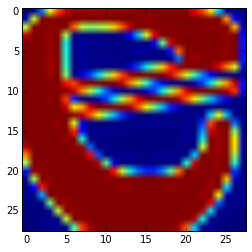

(329, 'true value', 'D', 'prediction value', 'I')


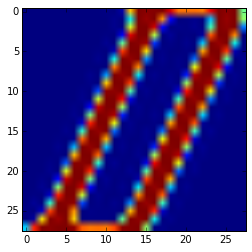

(330, 'true value', 'C', 'prediction value', 'I')


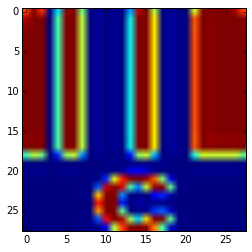

(331, 'true value', 'C', 'prediction value', 'E')


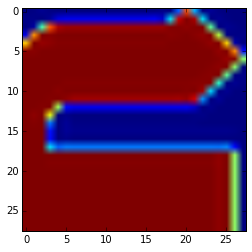

(332, 'true value', 'G', 'prediction value', 'B')


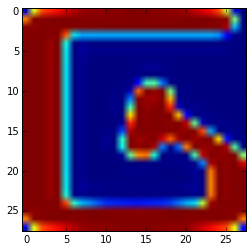

(333, 'true value', 'A', 'prediction value', 'C')


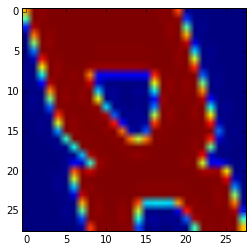

(334, 'true value', 'G', 'prediction value', 'E')


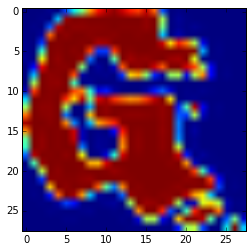

(335, 'true value', 'H', 'prediction value', 'J')


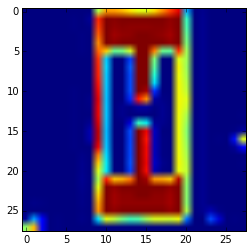

(336, 'true value', 'I', 'prediction value', 'J')


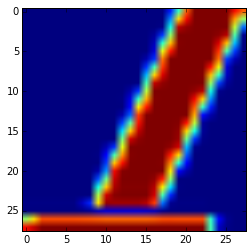

(337, 'true value', 'A', 'prediction value', 'G')


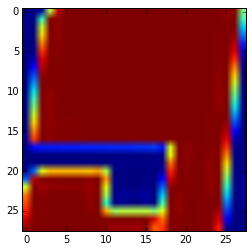

(338, 'true value', 'H', 'prediction value', 'E')


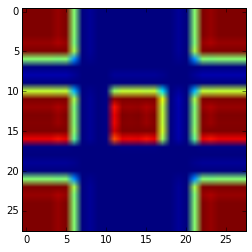

(339, 'true value', 'I', 'prediction value', 'D')


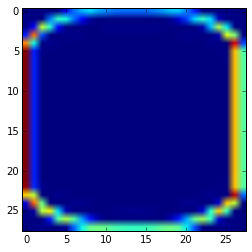

(340, 'true value', 'E', 'prediction value', 'C')


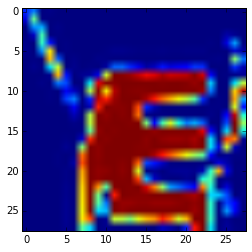

(341, 'true value', 'A', 'prediction value', 'D')


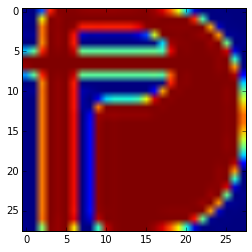

(342, 'true value', 'H', 'prediction value', 'A')


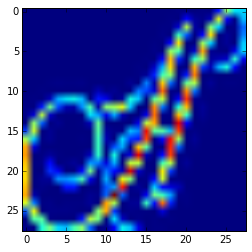

(343, 'true value', 'J', 'prediction value', 'I')


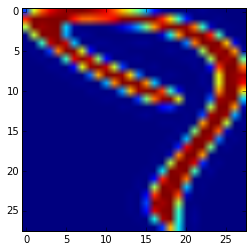

(344, 'true value', 'D', 'prediction value', 'A')


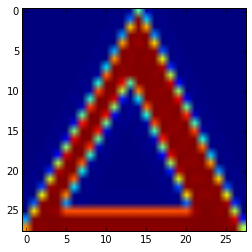

(345, 'true value', 'E', 'prediction value', 'D')


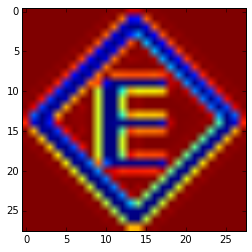

(346, 'true value', 'I', 'prediction value', 'A')


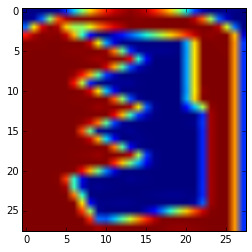

(347, 'true value', 'A', 'prediction value', 'B')


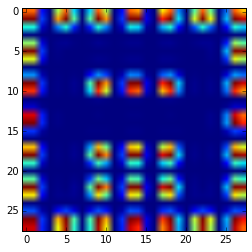

(348, 'true value', 'I', 'prediction value', 'J')


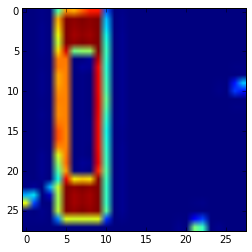

(349, 'true value', 'J', 'prediction value', 'I')


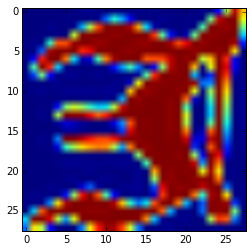

(350, 'true value', 'I', 'prediction value', 'J')


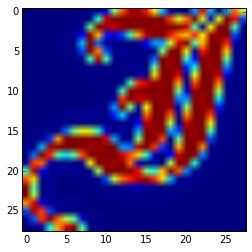

(351, 'true value', 'D', 'prediction value', 'J')


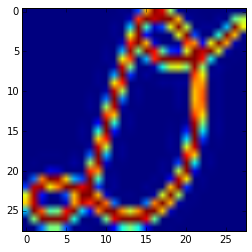

(352, 'true value', 'C', 'prediction value', 'J')


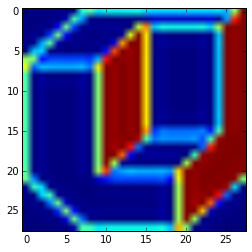

(353, 'true value', 'I', 'prediction value', 'F')


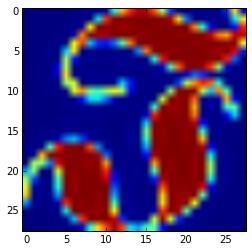

(354, 'true value', 'I', 'prediction value', 'D')


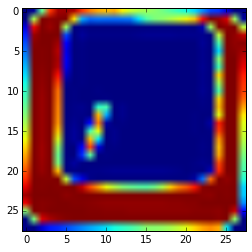

(355, 'true value', 'J', 'prediction value', 'I')


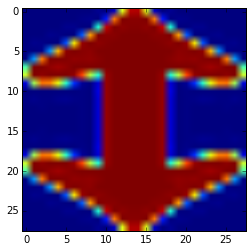

(356, 'true value', 'C', 'prediction value', 'H')


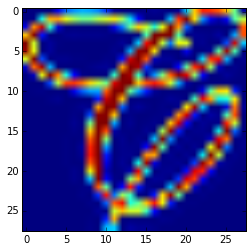

(357, 'true value', 'G', 'prediction value', 'I')


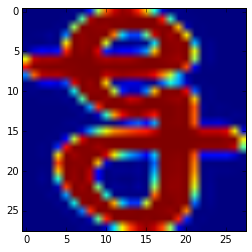

(358, 'true value', 'E', 'prediction value', 'F')


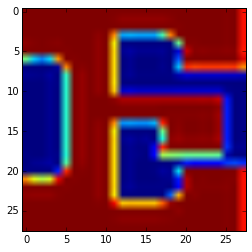

(359, 'true value', 'I', 'prediction value', 'J')


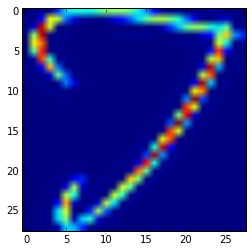

(360, 'true value', 'F', 'prediction value', 'I')


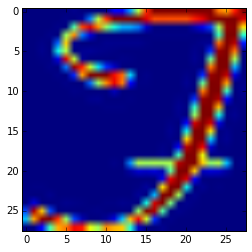

(361, 'true value', 'B', 'prediction value', 'D')


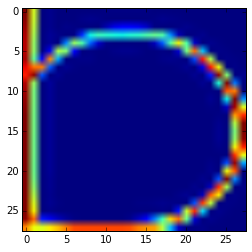

(362, 'true value', 'I', 'prediction value', 'B')


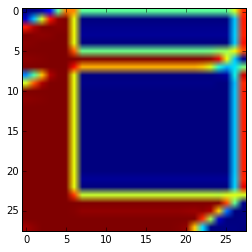

(363, 'true value', 'J', 'prediction value', 'I')


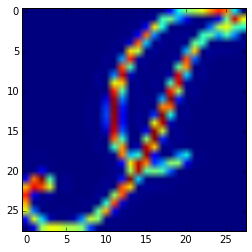

(364, 'true value', 'C', 'prediction value', 'J')


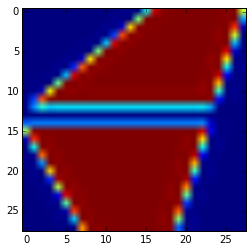

(365, 'true value', 'F', 'prediction value', 'J')


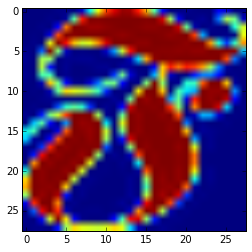

(366, 'true value', 'I', 'prediction value', 'H')


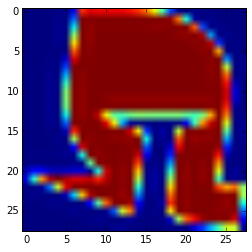

(367, 'true value', 'H', 'prediction value', 'I')


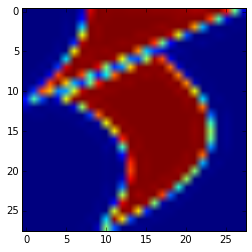

(368, 'true value', 'E', 'prediction value', 'J')


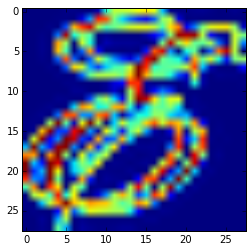

(369, 'true value', 'B', 'prediction value', 'C')


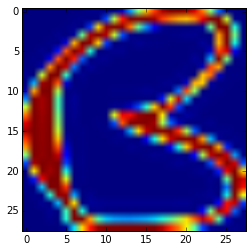

(370, 'true value', 'E', 'prediction value', 'F')


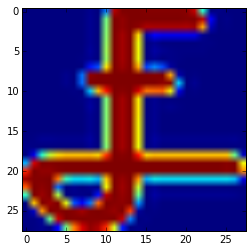

In [43]:
print 'Plots of first 100 Residuals / Mis classifactions'
miss_data = miss_data.reshape((-1, 28, 28))
N = miss_data.shape[0]
charset = 'ABCDEFGHIJ'
for i in range(N):
    print(i, 'true value', charset[miss_true_label[i]], 'prediction value', charset[miss_pred_label[i]] )
    plt.imshow(miss_data[i].reshape(28, 28))
    plt.show()